In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import plot_confusion_matrix
import sklearn
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
import warnings
from sklearn.metrics import accuracy_score
from matplotlib.colors import ListedColormap
from sklearn import datasets
from matplotlib.ticker import MaxNLocator # needed for integer only on axis
from matplotlib.lines import Line2D # for creating the custom legend
plt.style.use('seaborn-whitegrid') # set style because it looks nice
# fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8,6), dpi=150)

# **Load The Iris Dataset**

In [ ]:
iris  = load_iris()
data = pd.DataFrame(data = np.c_[iris['data'], iris['target']], columns = iris['feature_names']+['target'])
data

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0.0
1,4.9,3.0,1.4,0.2,0.0
2,4.7,3.2,1.3,0.2,0.0
3,4.6,3.1,1.5,0.2,0.0
4,5.0,3.6,1.4,0.2,0.0
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,2.0
146,6.3,2.5,5.0,1.9,2.0
147,6.5,3.0,5.2,2.0,2.0
148,6.2,3.4,5.4,2.3,2.0


In [ ]:
X = data.iloc[0:,0:2]
Y = data.iloc[0:,4:5]

Text(0, 0.5, 'sepal width (cm)')

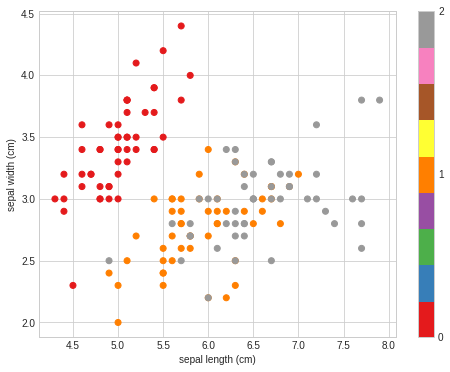

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=iris.target,cmap=plt.cm.Set1)
plt.colorbar(ticks=[0, 1, 2])
plt.xlabel(iris.feature_names[0])
plt.ylabel(iris.feature_names[1])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.25)
X_train

,sepal length (cm),sepal width (cm)
2,4.7,3.2
118,7.7,2.6
99,5.7,2.8
33,5.5,4.2
96,5.7,2.9
...,...,...
38,4.4,3.0
64,5.6,2.9
80,5.5,2.4
56,6.3,3.3


# **Universal Function for plotting Decesion Boundary**

In [ ]:
H = 0.1 # mesh stepsize
PROB_DOT_SCALE = 40 # modifier to scale the probability dots
PROB_DOT_SCALE_POWER = 3 # exponential used to increase/decrease size of prob dots
TRUE_DOT_SIZE = 50 # size of the true labels
PAD = 1.0 # how much to "pad" around the true labels

# establish colors and colormap
redish = '#d73027'
orangeish = '#fc8d59'
blueish = '#4575b4'
colormap = np.array([redish,blueish,orangeish])

#establish classes
classes = ['c','s','v']


In [ ]:
def plot_decision_boundary2D(clf, X: np.ndarray, y: np.ndarray, classes: list, colormap: np.ndarray,
                             step: float = 0.1, prob_dot_scale: int = 40, prob_dot_scale_power: int = 3,
                             true_dot_size: int = 50, pad: float = 1.0,
                             prob_values: list = [0.4, 0.6, 0.8, 1.0]) -> None:
    """
    Original work by @timothyvh on Twitter.
    Recreating an R ggplot decision boundary plotting in python using matplotlib. 
    Note that this only works for 2D plotting. The goal of this function is to present a 
    classifier's decision boundary in an easy to read, digestible way to ease
    communication and visualization of results. 
    
    Arguments:
    clf - the classifier we want to visualize the decision boundary for. This should work for any kind of relevant model.
    X - our data we want to plot. Note that since this is a 2D array, X should be 2-dimensional.
    y - the target labels for the data we want to plot
    classes - the names of the classes you are trying to identify, should be same shape as colormap
    colormap - the colors you want to use to indicate your different classes, should be same shape as classes
    step - mesh stepsize
    prob_dot_scale - modifier to scale the probability dots
    prob_dot_scale_power - exponential used to increase/decrease size of prob dots
    true_dot_size - size of the true labels
    pad - how much to "pad" around the true labels
    prob_values - list of probabilities to map the meshgrid predictions to

    Returns:
    None - This function will simply output a graph of the decision boundary
    """
    # Handling X data dimension issues. If X doesn't have enough dimensions, throw error. Too many, use first two dimensions.
    X_dim = X.shape[1]
    if X_dim < 2:
        raise Exception("Error: Not enough dimensions in input data. Data must be at least 2-dimensional.")
    elif X_dim > 2: 
        warnings.warn(f"Warning: input data was {X_dim} dimensional. Expected 2. Using first 2 dimensions provided.")
    
    # Change colormap to a numpy array if it isn't already (necessary to prevent scalar error)
    if not isinstance(colormap, np.ndarray):
        colormap = np.array(colormap)        
        
    # create the x0, x1 feature. This is only a 2D plot after all. 
    x0 = X[:,0]
    x1 = X[:,1]
    
    # create 1D arrays representing the range of probability data points
    x0_min, x0_max = np.round(x0.min())-pad, np.round(x0.max()+pad)
    x1_min, x1_max = np.round(x1.min())-pad, np.round(x1.max()+pad)    
    x0_axis_range = np.arange(x0_min,x0_max, step)
    x1_axis_range = np.arange(x1_min,x1_max, step)
    
    # create meshgrid between the two axis ranges
    xx0, xx1 = np.meshgrid(x0_axis_range, x1_axis_range)
    
    # put the xx in the same dimensional format as the original X
    xx = np.reshape(np.stack((xx0.ravel(),xx1.ravel()),axis=1),(-1,2))
    
    yy_hat = clf.predict(xx) # prediction of all the little dots
    yy_prob = clf.predict_proba(xx) # probability of each dot being 
                                    # the predicted color
    yy_size = np.max(yy_prob, axis=1)
    
    # make figure
    plt.style.use('seaborn-whitegrid') # set style because it looks nice
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8,6), dpi=150)
    
    # plot all the little dots
    ax.scatter(xx[:,0], xx[:,1], c=colormap[yy_hat], alpha=0.4, s=prob_dot_scale*yy_size**prob_dot_scale_power, linewidths=0,)
    
    # plot the contours
    ax.contour(x0_axis_range, x1_axis_range, 
               np.reshape(yy_hat,(xx0.shape[0],-1)), 
               levels=3, linewidths=1, 
               colors=[colormap[0],colormap[1], colormap[1], colormap[2],])
 
    # plot the original x values.
    ax.scatter(x0, x1, c=colormap[y], s=true_dot_size, zorder=3, linewidths=0.7, edgecolor='k')
 
    # create legends - Not sure if these serve a purpose but I left them in just in case
    x_min, x_max = ax.get_xlim()
    y_min, y_max = ax.get_ylim()
 
    ax.set_ylabel(r"Sepal Width")
    ax.set_xlabel(r"Sepal Length")
    
    # set the aspect ratio to 1, for looks
    ax.set_aspect(1)
 
    # create class legend
    legend_class = []
    for class_id, color in zip(classes, colormap):
        legend_class.append(Line2D([0], [0], marker='o', label=class_id,ls='None',
                                   markerfacecolor=color, markersize=np.sqrt(true_dot_size), 
                                   markeredgecolor='k', markeredgewidth=0.7))
 
    # iterate over each of the probabilities to create prob legend
    legend_prob = []
    for prob in prob_values:
        legend_prob.append(Line2D([0], [0], marker='o', label=prob, ls='None', alpha=0.8,
                                  markerfacecolor='grey', 
                                  markersize=np.sqrt(prob_dot_scale*prob**prob_dot_scale_power), 
                                  markeredgecolor='k', markeredgewidth=0))
 
 
    legend1 = ax.legend(handles=legend_class, loc='center', 
                        bbox_to_anchor=(1.05, 0.35),
                        frameon=False, title='class')
 
    legend2 = ax.legend(handles=legend_prob, loc='center', 
                        bbox_to_anchor=(1.05, 0.65),
                        frameon=False, title='prob', )
 
    ax.add_artist(legend1) # add legend back after it disappears
 
    ax.set_yticks(np.arange(x1_min,x1_max, 1)) # I don't like the decimals
    ax.grid(False) # remove gridlines (inherited from 'seaborn-whitegrid' style)
 
    # only use integers for axis tick labels
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
 
    # remove first ticks from axis labels, for looks
    ax.set_xticks(ax.get_xticks()[1:-1])
    ax.set_yticks(np.arange(x1_min,x1_max, 1)[1:])
 
    plt.show()



    

# **Classify Data using KNN**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier


In [ ]:
classifier = KNeighborsClassifier()
classifier.fit(X_train,y_train)
predict_y = classifier.predict(X_test)
print("The accuracy score is : ",accuracy_score(y_test, predict_y))

The accuracy score is :  0.6578947368421053


/usr/local/lib/python3.7/dist-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Train set accuracy is : 0.8392857142857143
Test set accuracy is :  0.7894736842105263


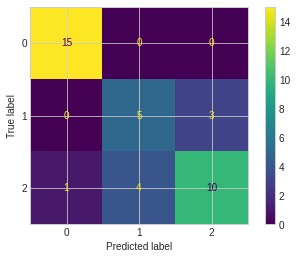

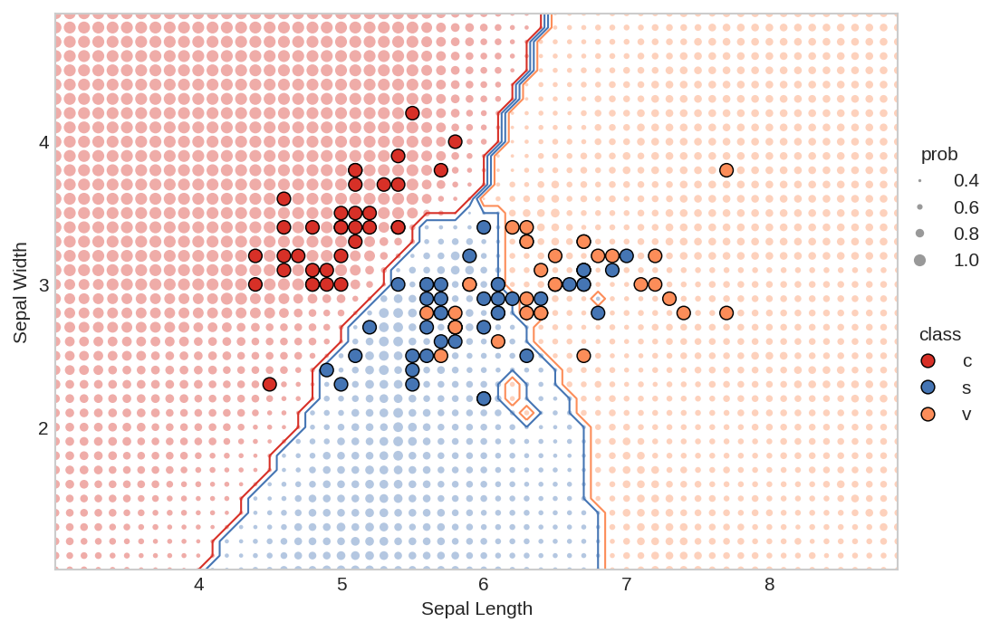

In [ ]:
# set main parameters for KNN plot
N_NEIGHBORS = [8,10,16] # KNN number of neighbors
# load data again
iris = datasets.load_iris()
X = iris.data[:,0:2]
Y = iris.target
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = .25)
knn = KNeighborsClassifier(16, weights="uniform",metric='euclidean')
knn.fit(X_train, y_train)
print("Train set accuracy is :", sklearn.metrics.accuracy_score(y_train,knn.predict(X_train)))
print("Test set accuracy is : ",sklearn.metrics.accuracy_score(y_test,knn.predict(X_test)))
plot_confusion_matrix(knn, X_test, y_test)
# use function
plot_decision_boundary2D(knn, X_train, y_train, classes, colormap, 
                        step=H, 
                        prob_dot_scale=PROB_DOT_SCALE, 
                        prob_dot_scale_power=PROB_DOT_SCALE_POWER,
                        true_dot_size=TRUE_DOT_SIZE, 
                        pad=PAD,)

# **Tuning Hyperparameters of KNN**

Train set accuracy is : 0.8482142857142857
Test set accuracy is :  0.6842105263157895


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


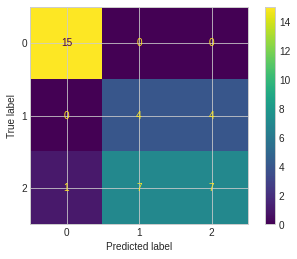

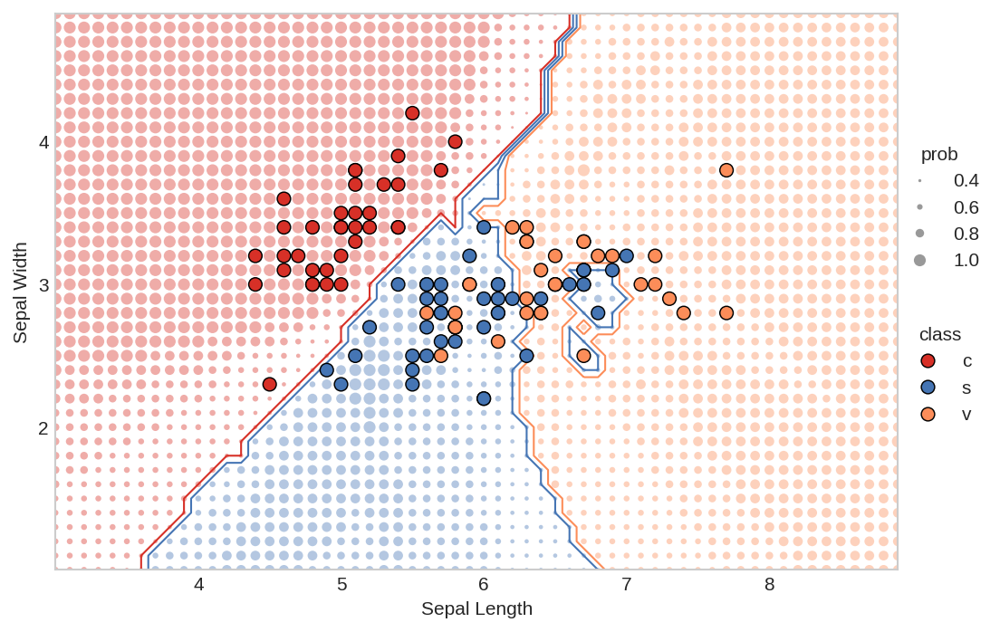

Train set accuracy is : 0.8392857142857143
Test set accuracy is :  0.7105263157894737


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


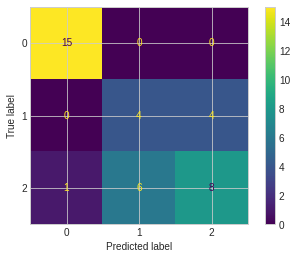

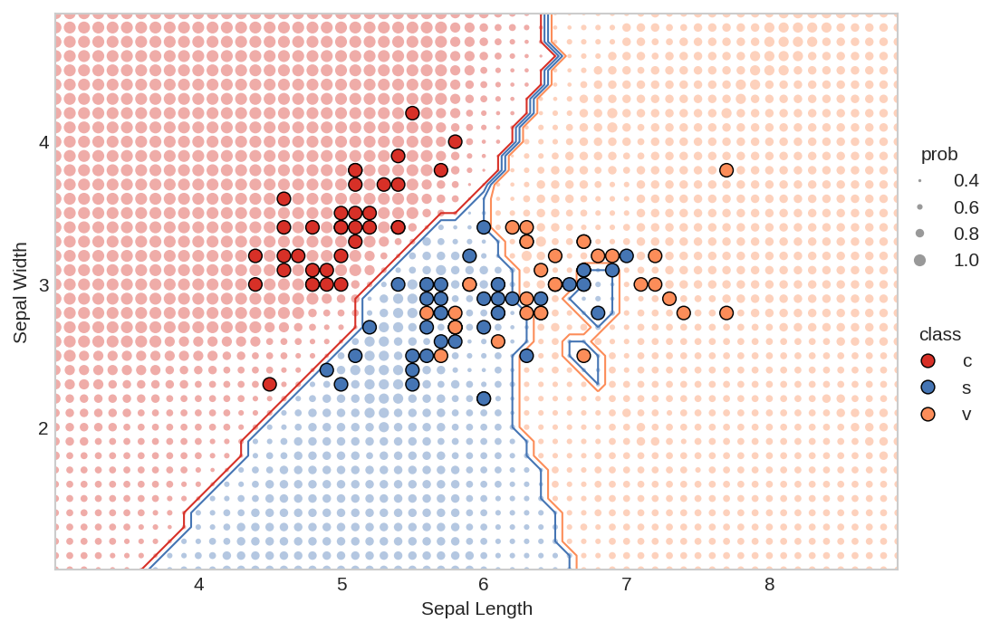

Train set accuracy is : 0.8392857142857143
Test set accuracy is :  0.7894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


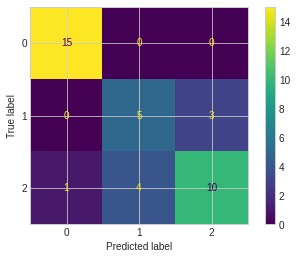

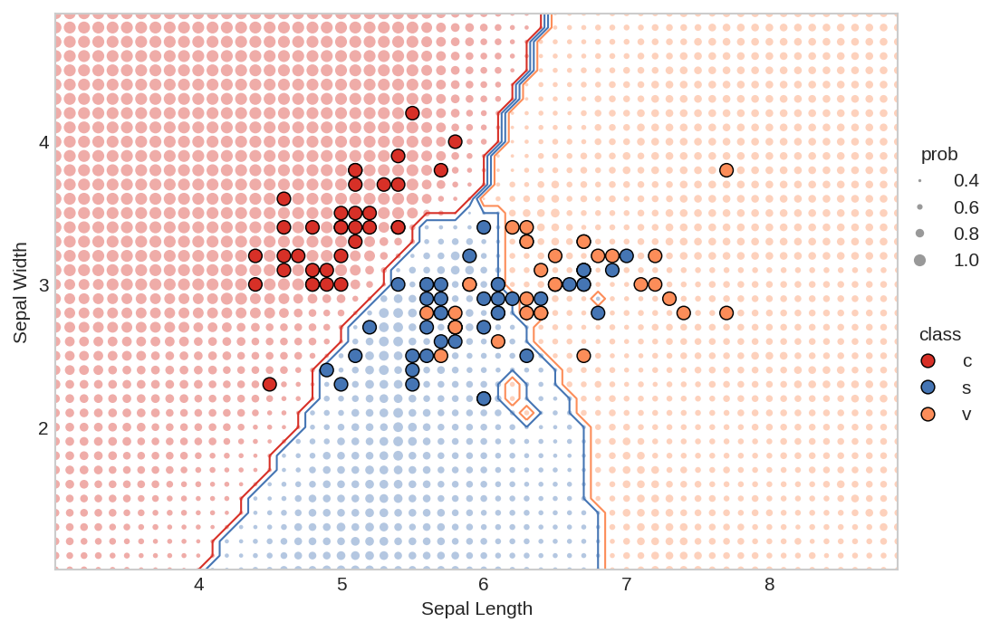

Train set accuracy is : 0.9285714285714286
Test set accuracy is :  0.7105263157894737


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


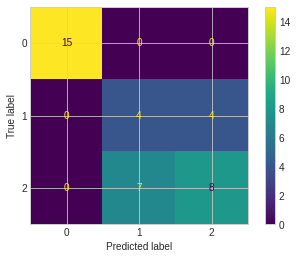

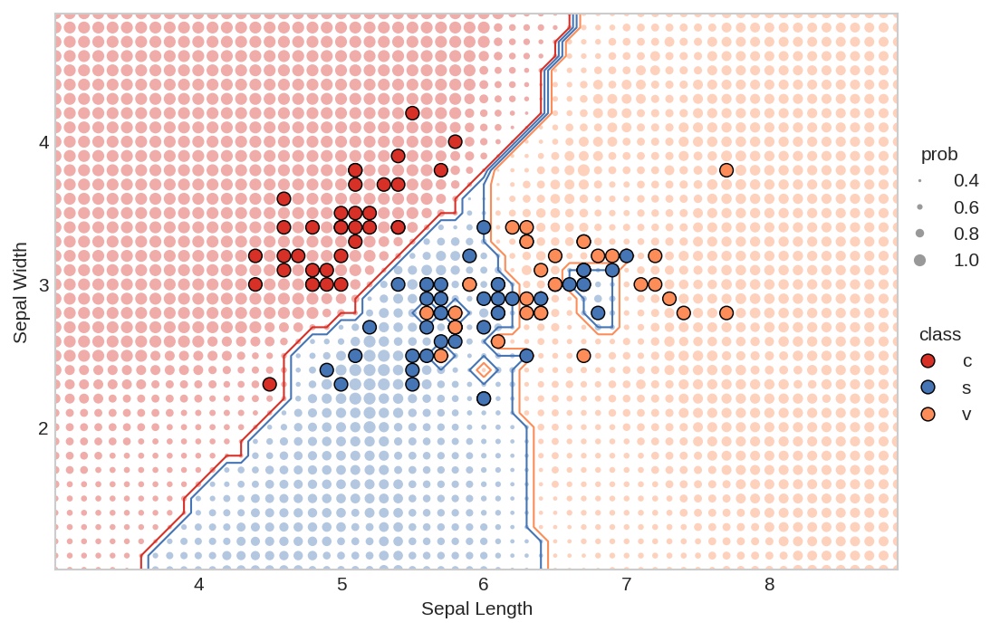

Train set accuracy is : 0.9285714285714286
Test set accuracy is :  0.7105263157894737


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


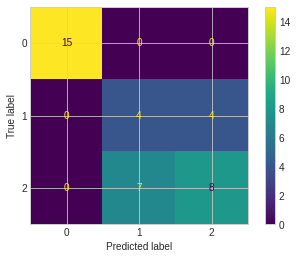

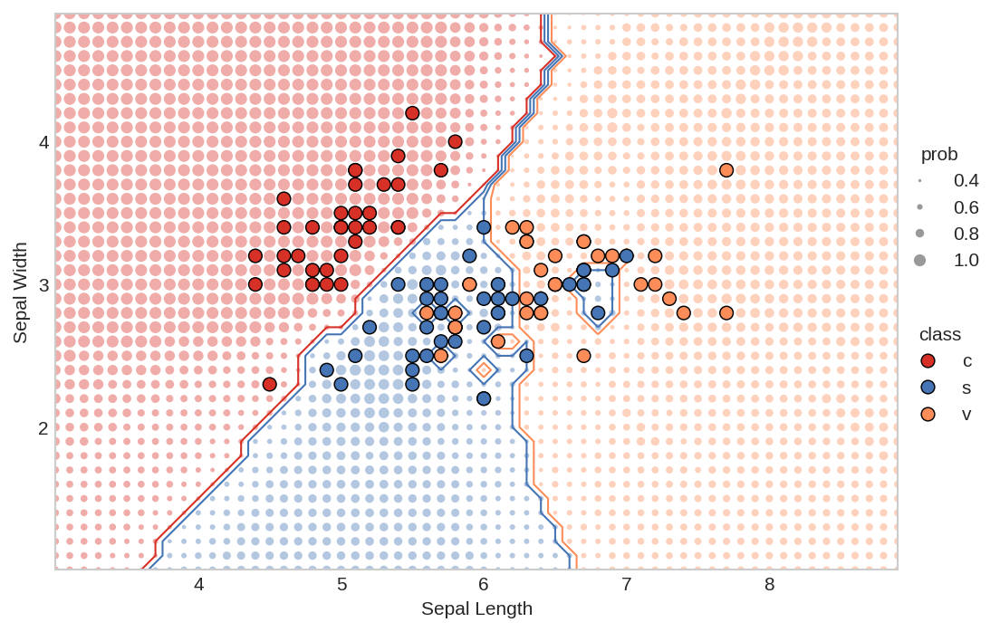

Train set accuracy is : 0.9285714285714286
Test set accuracy is :  0.7368421052631579


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


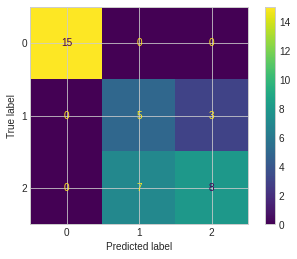

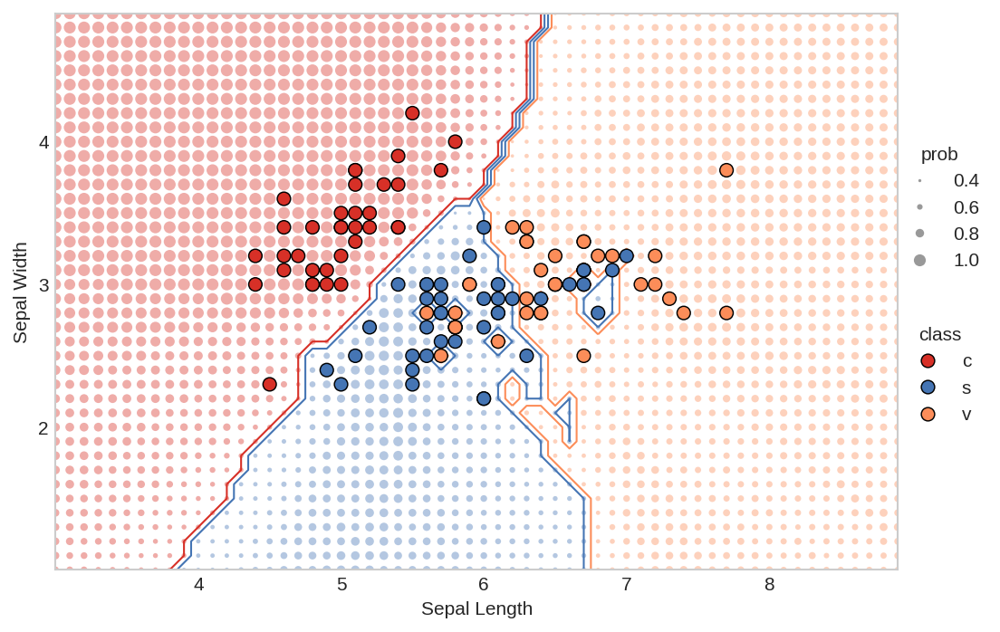

Train set accuracy is : 0.8482142857142857
Test set accuracy is :  0.6842105263157895


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


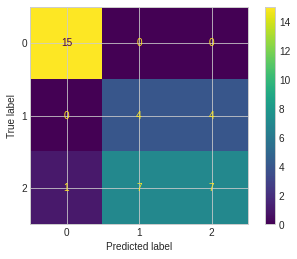

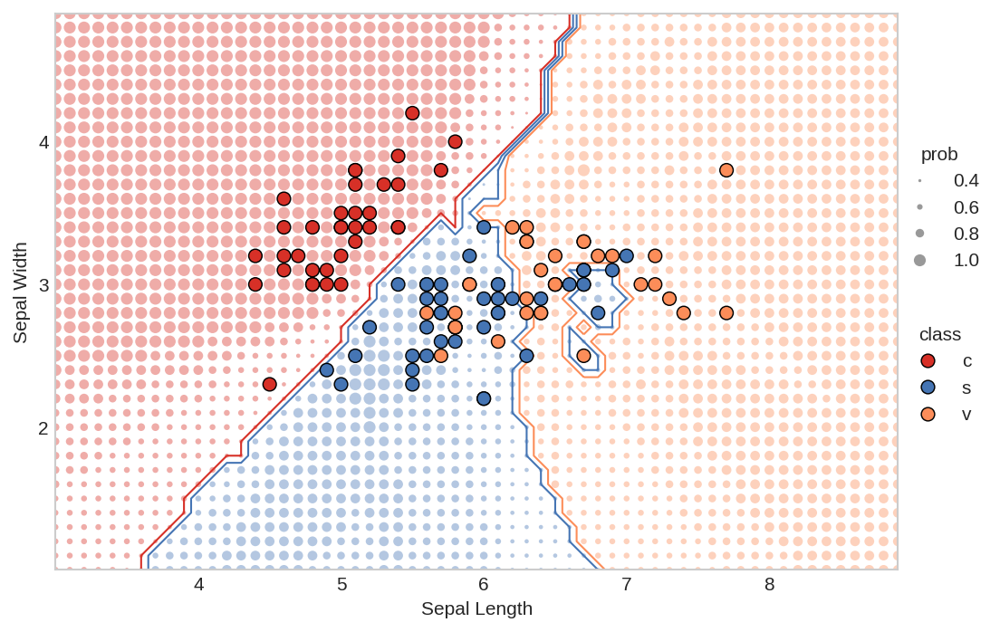

Train set accuracy is : 0.8392857142857143
Test set accuracy is :  0.7105263157894737


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


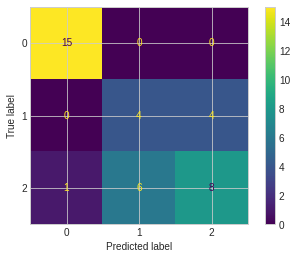

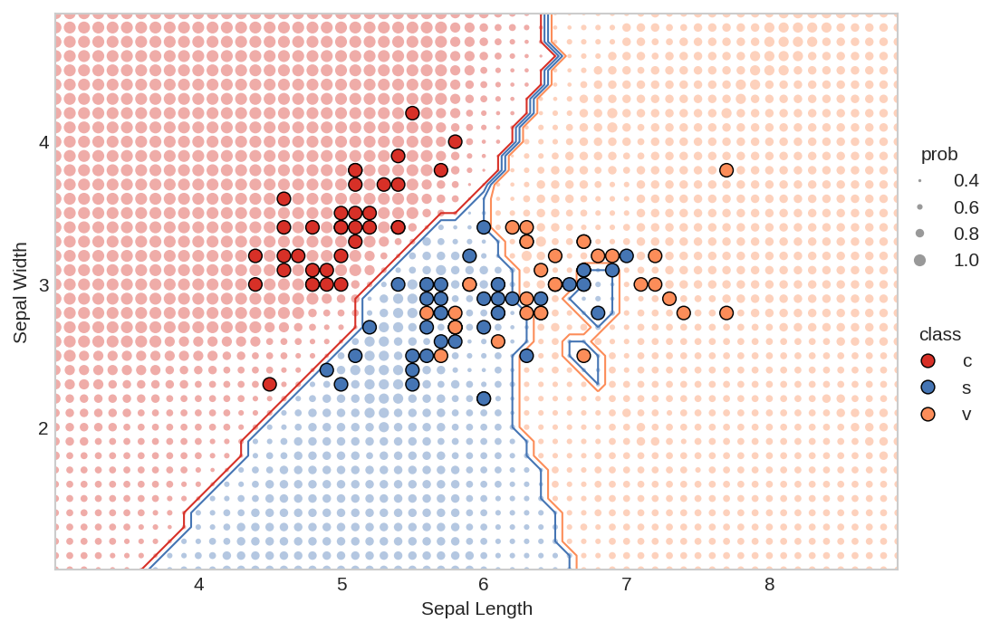

Train set accuracy is : 0.8392857142857143
Test set accuracy is :  0.7894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


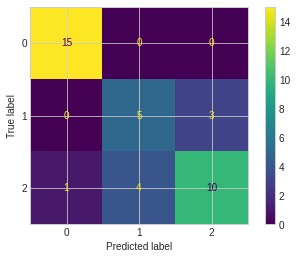

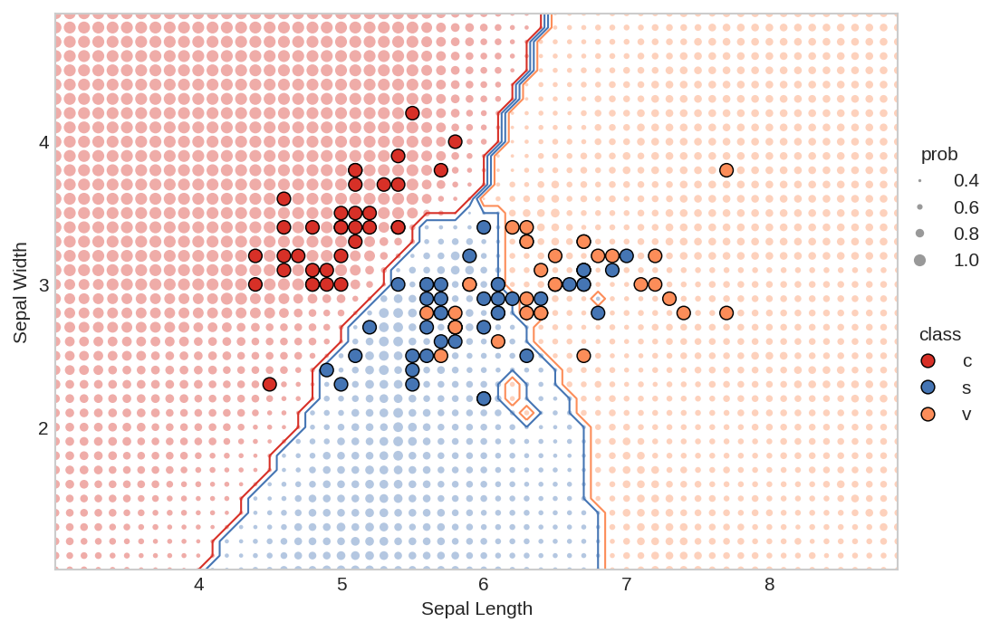

Train set accuracy is : 0.9285714285714286
Test set accuracy is :  0.7105263157894737


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


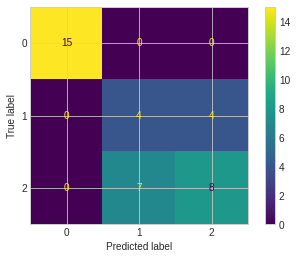

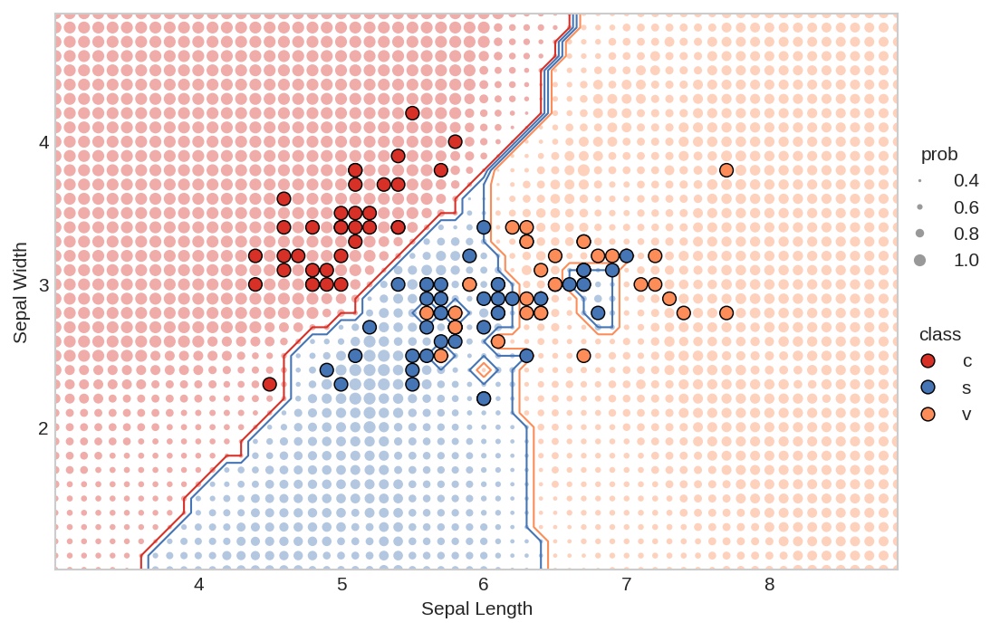

Train set accuracy is : 0.9285714285714286
Test set accuracy is :  0.7105263157894737


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


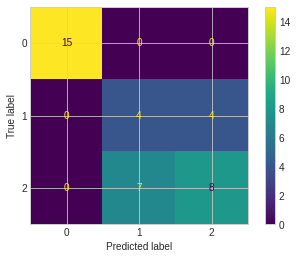

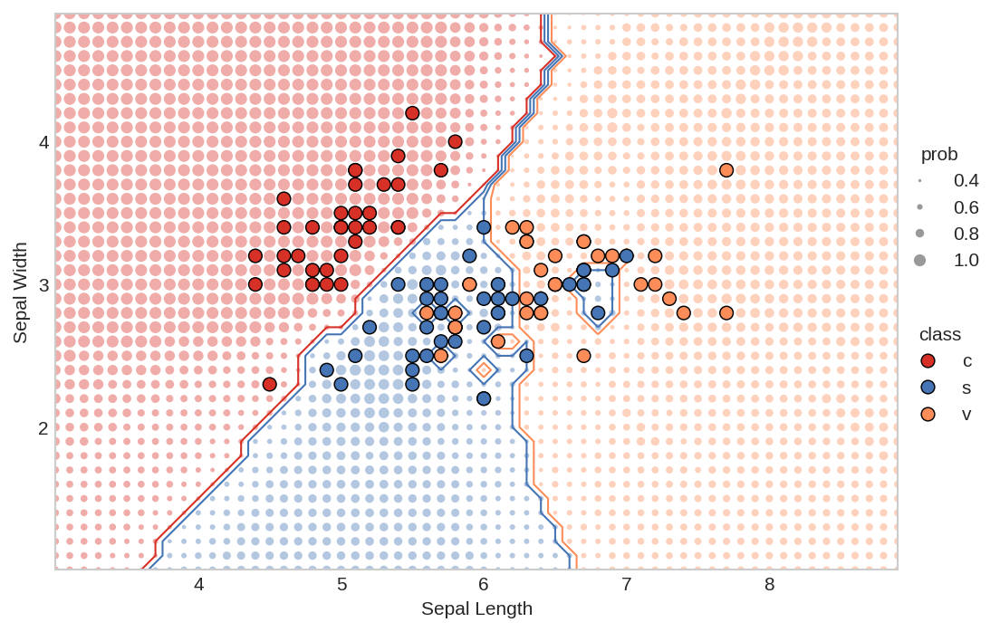

Train set accuracy is : 0.9285714285714286
Test set accuracy is :  0.7368421052631579


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


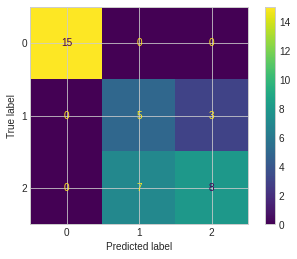

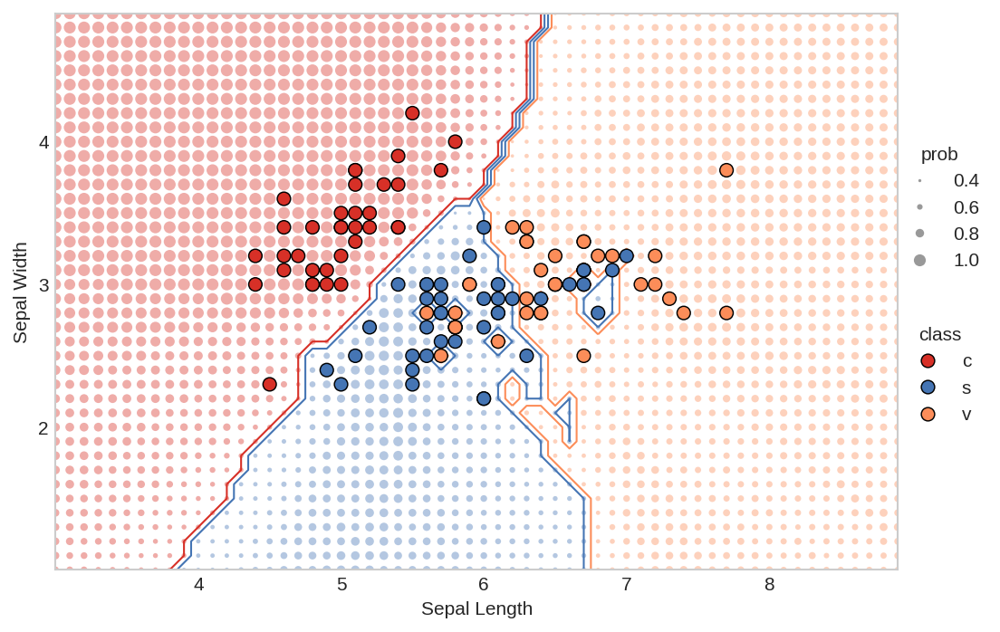

Train set accuracy is : 0.8125
Test set accuracy is :  0.7105263157894737


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


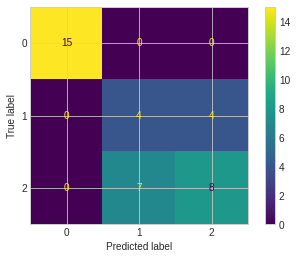

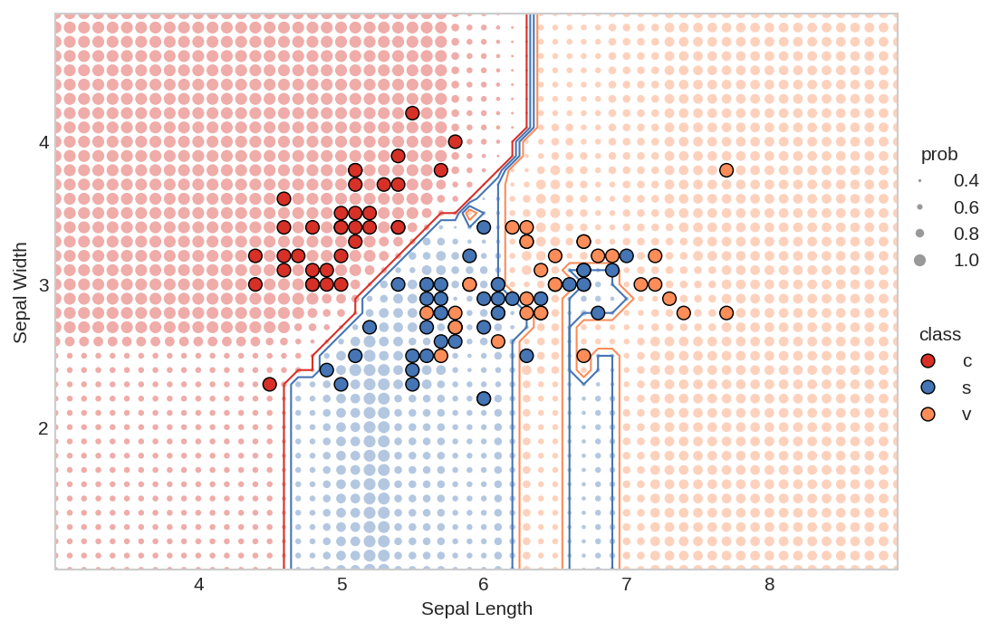

Train set accuracy is : 0.8303571428571429
Test set accuracy is :  0.7105263157894737


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


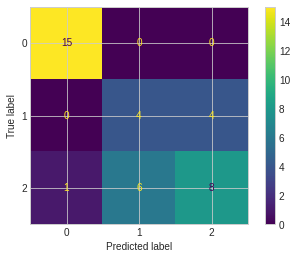

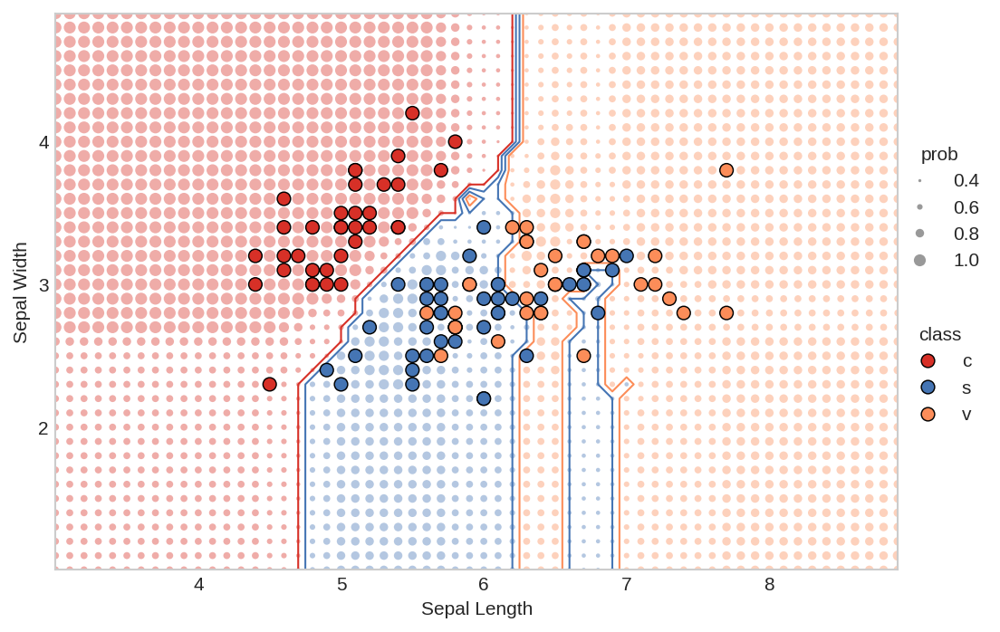

Train set accuracy is : 0.8035714285714286
Test set accuracy is :  0.7894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


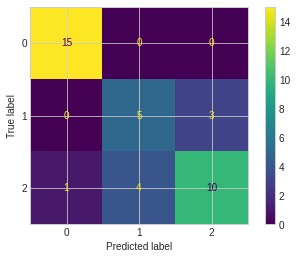

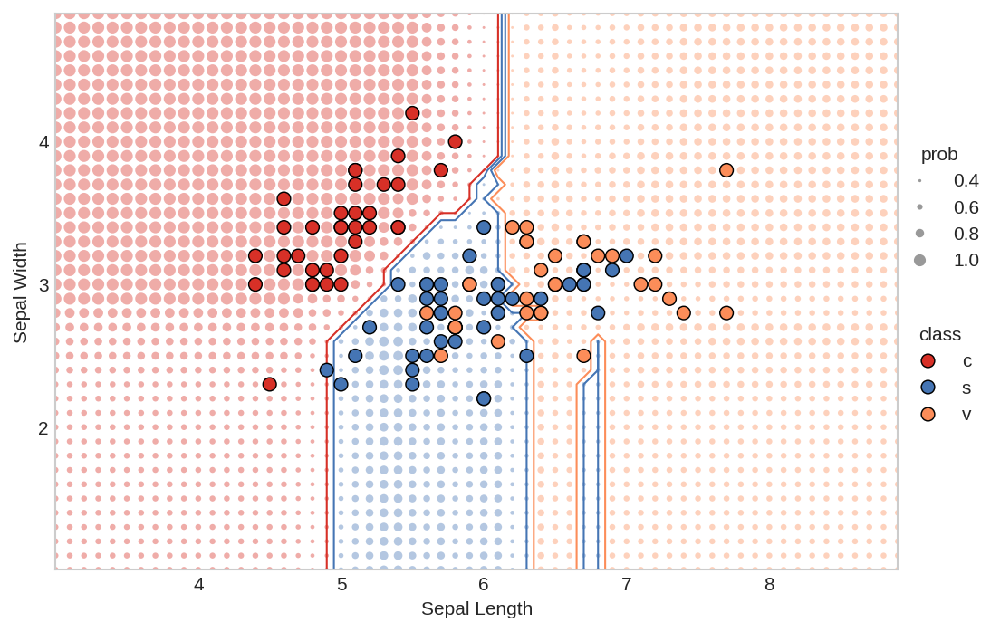

Train set accuracy is : 0.9285714285714286
Test set accuracy is :  0.7105263157894737


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


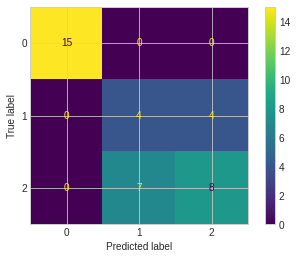

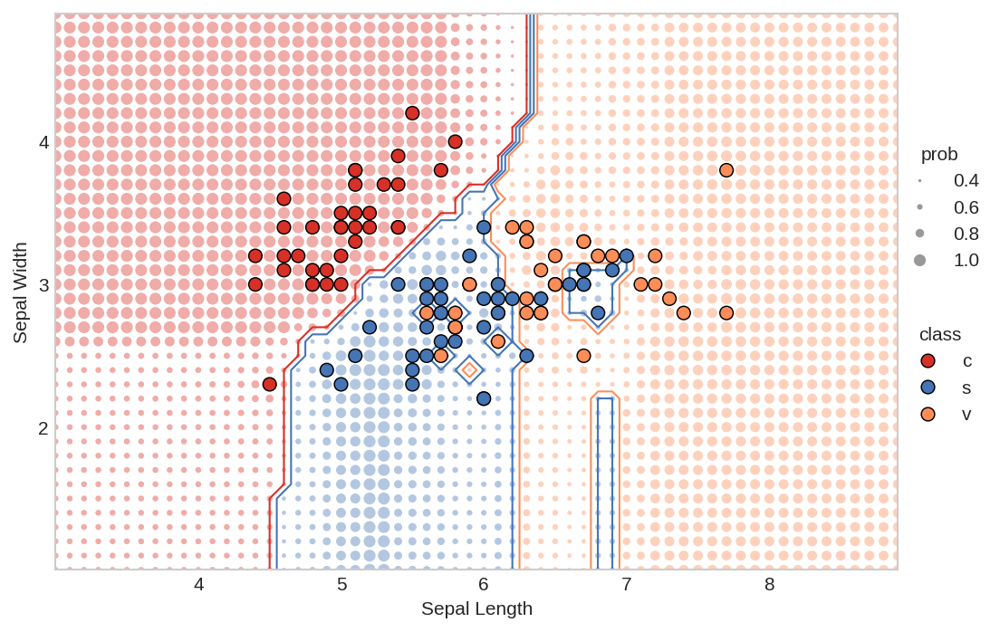

Train set accuracy is : 0.9285714285714286
Test set accuracy is :  0.7105263157894737


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


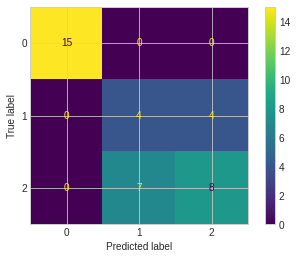

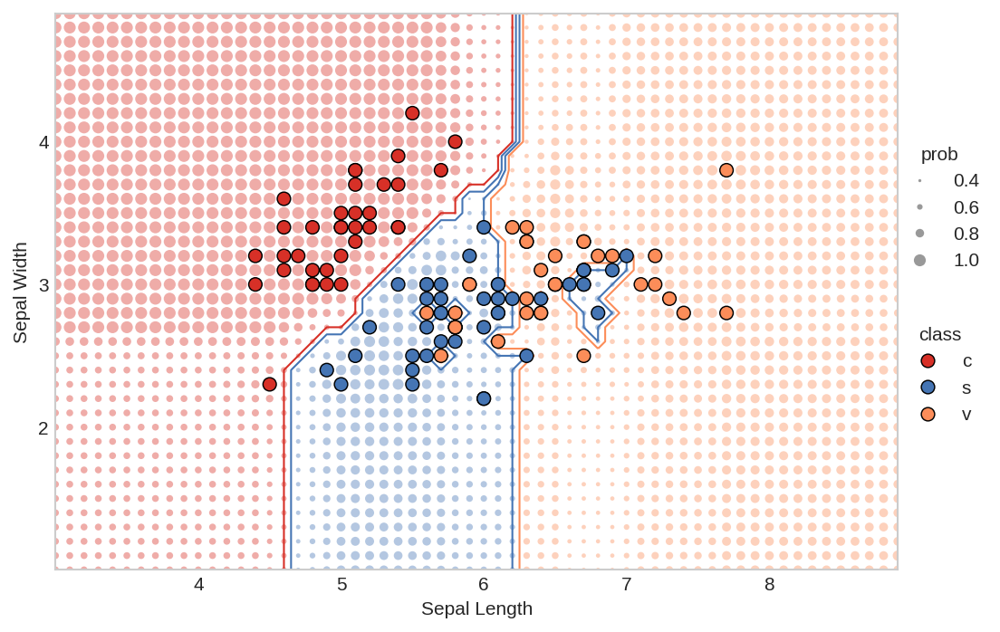

Train set accuracy is : 0.9285714285714286
Test set accuracy is :  0.7631578947368421


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


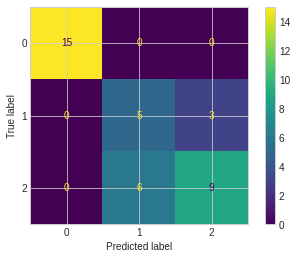

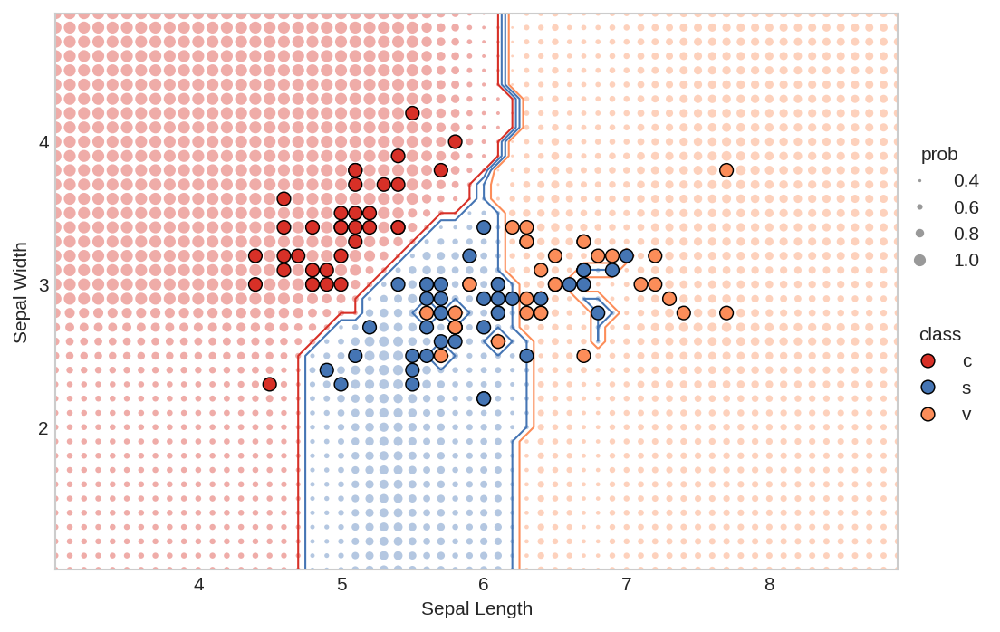

In [ ]:
w = ['uniform','distance']
m = ['minkowski','euclidean','manhattan']
for mt in m:
  for we in w:
    for neighbour in N_NEIGHBORS:
      knn = KNeighborsClassifier(neighbour, weights=we,metric=mt)
      knn.fit(X_train, y_train)
      train_accuracy = sklearn.metrics.accuracy_score(y_train,knn.predict(X_train))
      test_accuracy = sklearn.metrics.accuracy_score(y_test,knn.predict(X_test))
      print("Train set accuracy is :",train_accuracy)
      print("Test set accuracy is : ",test_accuracy)
      plot_confusion_matrix(knn, X_test, y_test)
      # use function
      plot_decision_boundary2D(knn, X_train, y_train, classes, colormap, 
                              step=H, 
                              prob_dot_scale=PROB_DOT_SCALE, 
                              prob_dot_scale_power=PROB_DOT_SCALE_POWER,
                              true_dot_size=TRUE_DOT_SIZE, 
                              pad=PAD,)

# **Dimension Reduction with PCA**

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca  = PCA(n_components = 2)
X_pca = pca.fit_transform(X,y = None)


In [ ]:
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X, Y, test_size = .25)


Text(0, 0.5, 'sepal width (cm)')

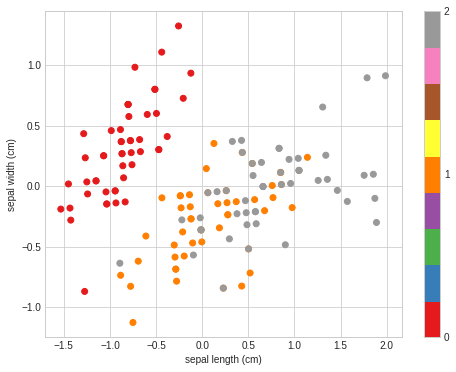

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=iris.target,cmap=plt.cm.Set1)
plt.colorbar(ticks=[0, 1, 2])
plt.xlabel(iris.feature_names[0])
plt.ylabel(iris.feature_names[1])

Train set accuracy is : 0.5089285714285714
Test set accuracy is :  0.5


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


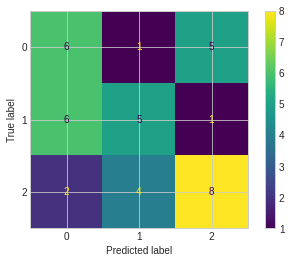

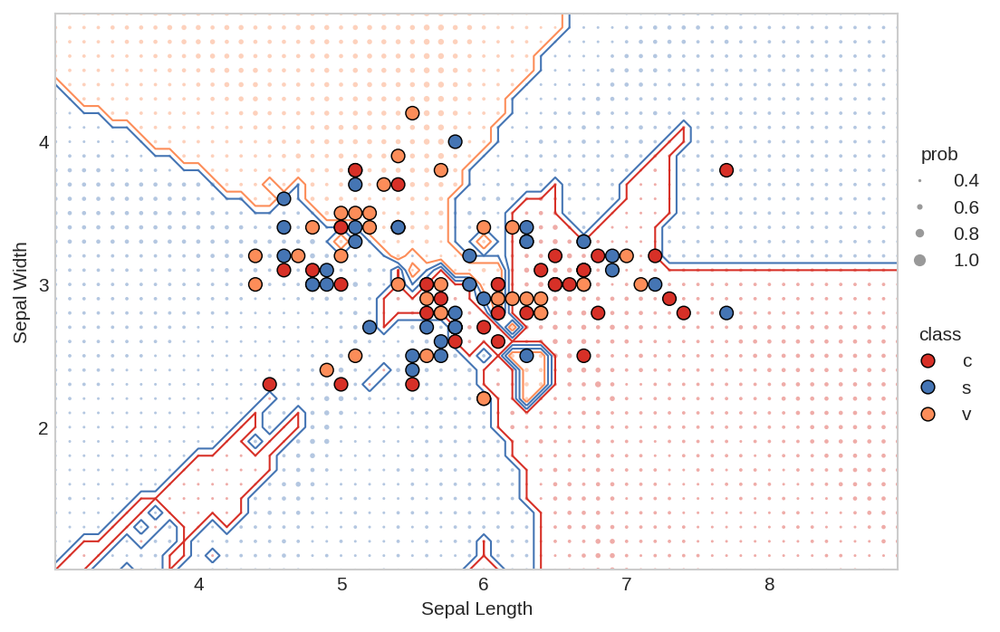

In [ ]:
knn = KNeighborsClassifier(16, weights="uniform",metric='euclidean')
knn.fit(X_train, y_train)
print("Train set accuracy is :", sklearn.metrics.accuracy_score(y_train,knn.predict(X_train)))
print("Test set accuracy is : ",sklearn.metrics.accuracy_score(y_test,knn.predict(X_test)))
plot_confusion_matrix(knn, X_test, y_test)
# use function
plot_decision_boundary2D(knn, X_train, y_train, classes, colormap, 
                        step=H, 
                        prob_dot_scale=PROB_DOT_SCALE, 
                        prob_dot_scale_power=PROB_DOT_SCALE_POWER,
                        true_dot_size=TRUE_DOT_SIZE, 
                        pad=PAD,)

# **Neural Network**

In [ ]:
from sklearn.neural_network import MLPClassifier

**Single Layer**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = .25)
# print(X_train)

Accuracy Scores for Single Layer Perceptron On Train is 0.7894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


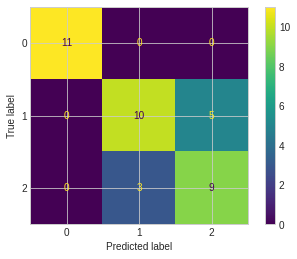

In [ ]:
#Single Layer Neural Network
single_layer = MLPClassifier(hidden_layer_sizes=(50),
                    activation='relu', solver='adam', 
                    shuffle=True, max_iter = 1000,
                    alpha=0.05)
single_layer.fit(X_train, y_train)
y_pred = single_layer.predict(X_test)
score = sklearn.metrics.accuracy_score(y_test, y_pred)
print('Accuracy Scores for Single Layer Perceptron On Train is',score)
plot_confusion_matrix(single_layer, X_test, y_test)

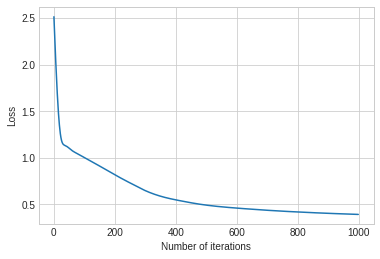

In [ ]:
fig, ax = plt.subplots(figsize=(6,4))
ax.plot(single_layer.loss_curve_)
ax.set_xlabel('Number of iterations')
ax.set_ylabel('Loss')
plt.show()

**Decesion Boundary**

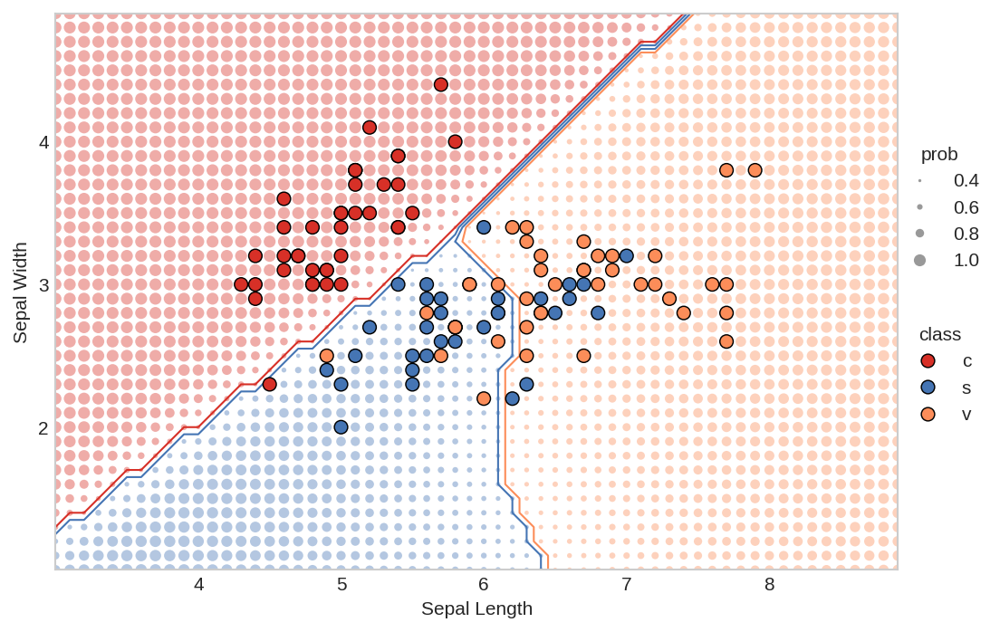

In [ ]:
plot_decision_boundary2D(single_layer, X_train, y_train, classes, colormap, 
                        step=H, 
                        prob_dot_scale=PROB_DOT_SCALE, 
                        prob_dot_scale_power=PROB_DOT_SCALE_POWER,
                        true_dot_size=TRUE_DOT_SIZE, 
                        pad=PAD,)

**Single Layer With PCA**

In [ ]:
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X, Y, test_size = .25)

Accuracy Score for test data is : 0.7105263157894737


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


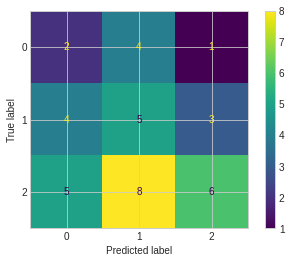

In [ ]:
#Single Layer Neural Network
single_layer_pca = MLPClassifier(hidden_layer_sizes=(50),
                    activation='relu', solver='adam', 
                    shuffle=True, max_iter = 1000,
                    alpha=0.05)
single_layer_pca.fit(X_train_pca, y_train)
y_pred = single_layer_pca.predict(X_test_pca)
score = sklearn.metrics.accuracy_score(y_test, y_pred)
print('Accuracy Score for test data is :',score)
plot_confusion_matrix(single_layer_pca, X_test, y_test)

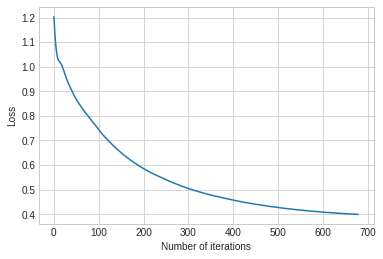

In [ ]:
fig, ax = plt.subplots(figsize=(6,4))
ax.plot(single_layer_pca.loss_curve_)
ax.set_xlabel('Number of iterations')
ax.set_ylabel('Loss')
plt.show()

**Decesion Boundary**

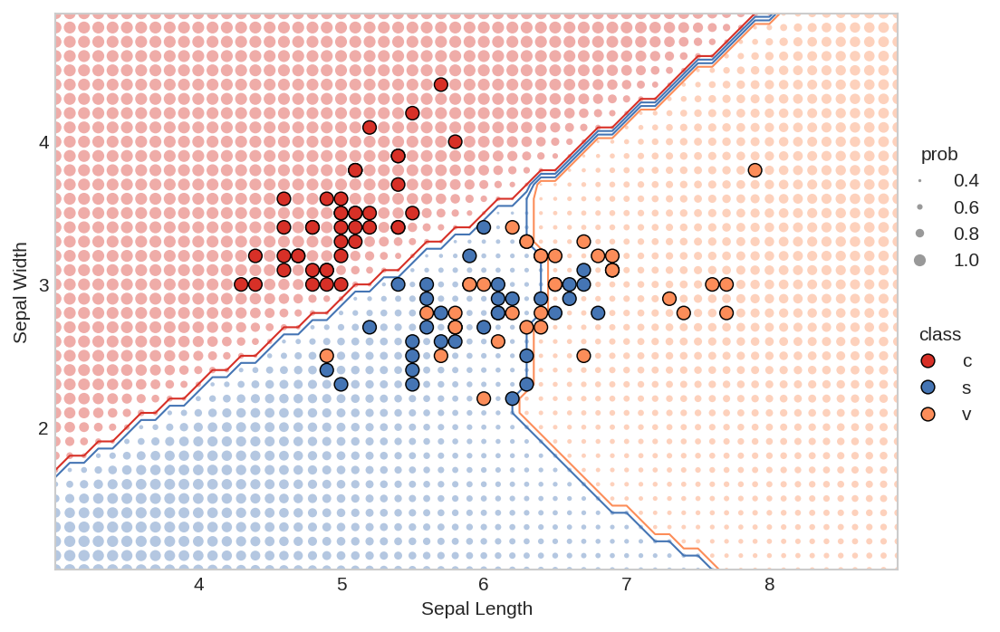

In [ ]:
plot_decision_boundary2D(single_layer_pca, X_train_pca, y_train, classes, colormap, 
                        step=H, 
                        prob_dot_scale=PROB_DOT_SCALE, 
                        prob_dot_scale_power=PROB_DOT_SCALE_POWER,
                        true_dot_size=TRUE_DOT_SIZE, 
                        pad=PAD,)

**Multi Layer**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = .25)

Accuracy Scores for training data is : 0.7368421052631579


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


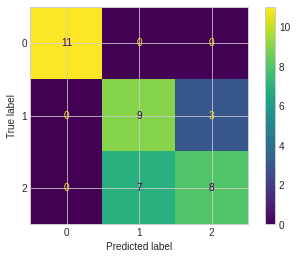

In [ ]:
mlp = MLPClassifier(hidden_layer_sizes=(50,100,50),
                    activation='relu', solver='adam', 
                    shuffle=True, max_iter = 1000,
                    alpha=0.5)
mlp.fit(X_train,y_train)
y_pred = mlp.predict(X_test)
score = sklearn.metrics.accuracy_score(y_test, y_pred)
print('Accuracy Scores for training data is :',score)
plot_confusion_matrix(mlp, X_test, y_test)

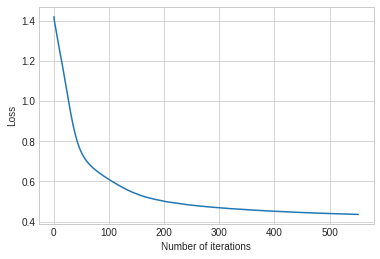

In [ ]:
fig, ax = plt.subplots(figsize=(6,4))
ax.plot(mlp.loss_curve_)
ax.set_xlabel('Number of iterations')
ax.set_ylabel('Loss')
plt.show()

**Decesion Boundary**

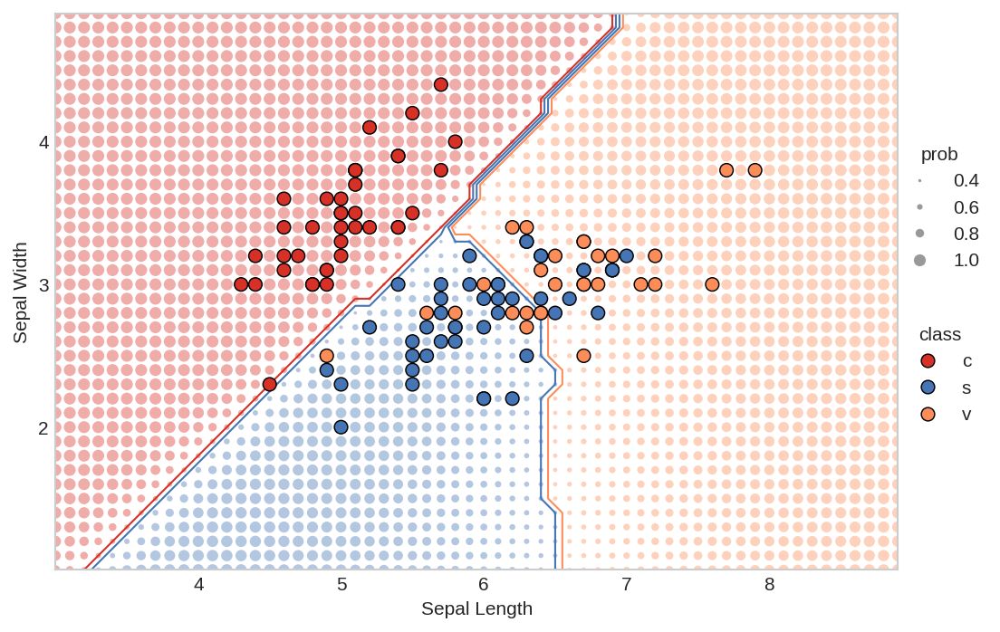

In [ ]:
plot_decision_boundary2D(mlp, X_train, y_train, classes, colormap, 
                        step=H, 
                        prob_dot_scale=PROB_DOT_SCALE, 
                        prob_dot_scale_power=PROB_DOT_SCALE_POWER,
                        true_dot_size=TRUE_DOT_SIZE, 
                        pad=PAD,)

**Multi Layer With PCA**

In [ ]:
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X, Y, test_size = .25)

Accuracy Scores for test data is : 0.8157894736842105


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


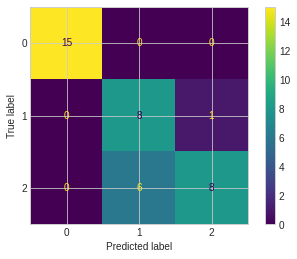

In [ ]:
mlp_pca = MLPClassifier(hidden_layer_sizes=(50,100,50),
                    activation='relu', solver='adam', 
                    shuffle=True, max_iter = 1000,
                    alpha=0.5)
mlp_pca.fit(X_train_pca,y_train)
y_pred = mlp_pca.predict(X_test_pca)
score = sklearn.metrics.accuracy_score(y_test, y_pred)
print('Accuracy Scores for test data is :', score)
plot_confusion_matrix(mlp_pca, X_test_pca, y_test)

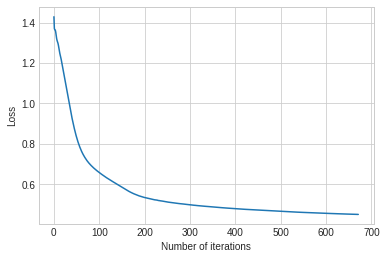

In [ ]:
fig, ax = plt.subplots(figsize=(6,4))
ax.plot(mlp_pca.loss_curve_)
ax.set_xlabel('Number of iterations')
ax.set_ylabel('Loss')
plt.show()

**Decesion Boundary**

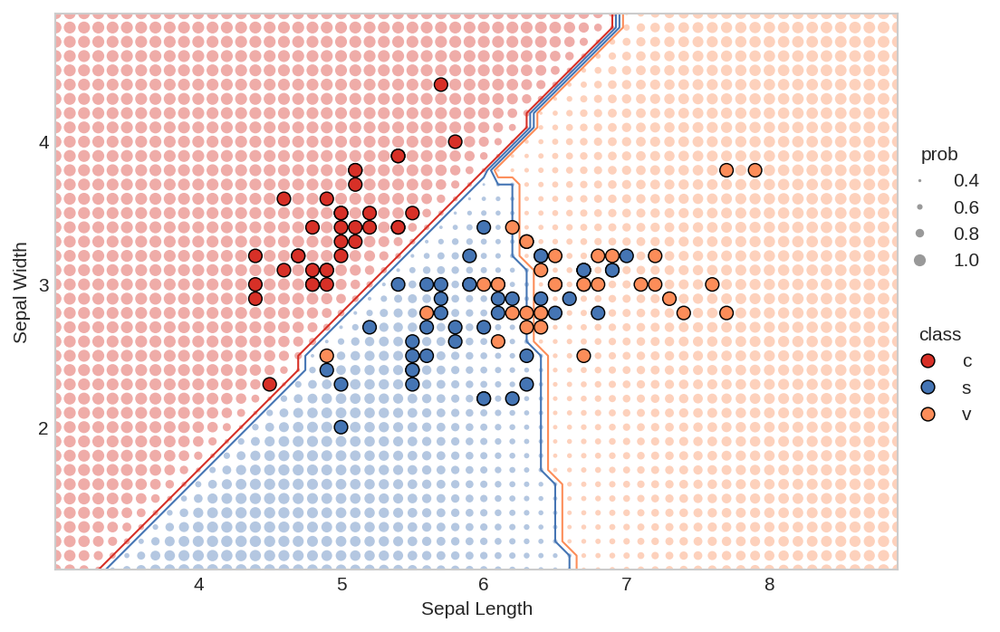

In [ ]:
plot_decision_boundary2D(mlp_pca, X_train_pca, y_train, classes, colormap, 
                        step=H, 
                        prob_dot_scale=PROB_DOT_SCALE, 
                        prob_dot_scale_power=PROB_DOT_SCALE_POWER,
                        true_dot_size=TRUE_DOT_SIZE, 
                        pad=PAD,)

# **SUPPORT VECTOR MACHINE**

In [ ]:
from sklearn.svm import SVC
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = .25)

The Training Accuracy is : 0.8035714285714286
The Testing Accuracy Score is :  0.7631578947368421


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


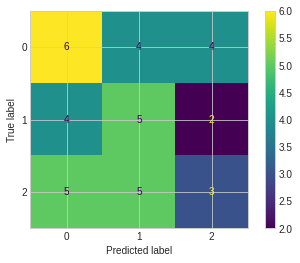

In [ ]:
#Using RBF kernel

svm = SVC(kernel = 'rbf',gamma='scale',probability=True)
svm.fit(X_train,y_train)
y_pred_train = svm.predict(X_train)
y_pred_test = svm.predict(X_test)
score_train = sklearn.metrics.accuracy_score(y_train, y_pred_train)
score_test = sklearn.metrics.accuracy_score(y_test, y_pred_test)
print("The Training Accuracy is :",score_train)
print("The Testing Accuracy Score is : ", score_test)
plot_confusion_matrix(svm, X_test_pca, y_test)

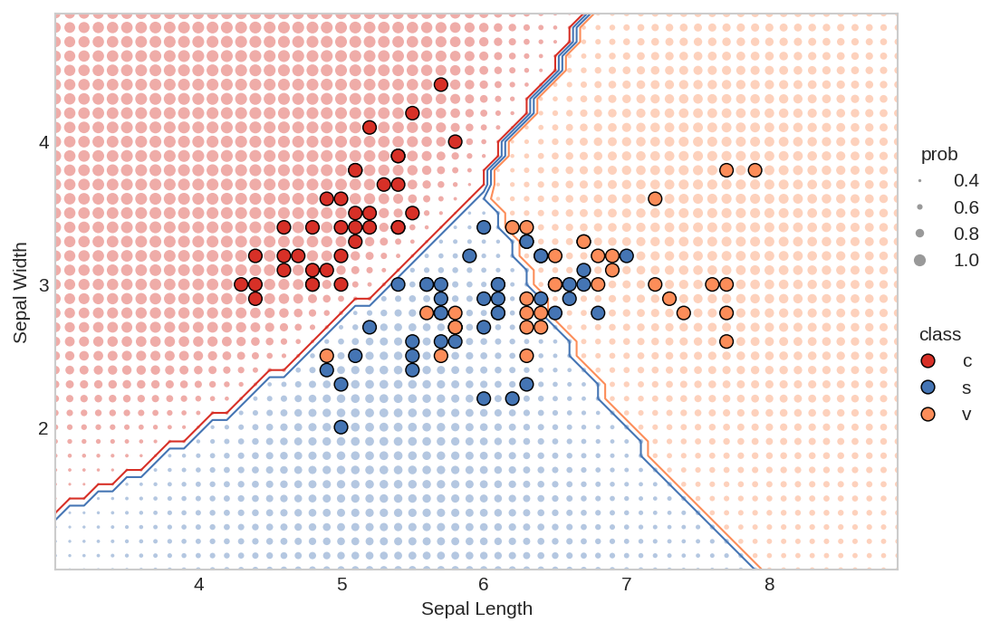

In [ ]:
plot_decision_boundary2D(svm, X_train, y_train, classes, colormap, 
                        step=H, 
                        prob_dot_scale=PROB_DOT_SCALE, 
                        prob_dot_scale_power=PROB_DOT_SCALE_POWER,
                        true_dot_size=TRUE_DOT_SIZE, 
                        pad=PAD,)

The Training Accuracy is : 0.7946428571428571
The Testing Accuracy Score is :  0.7631578947368421


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


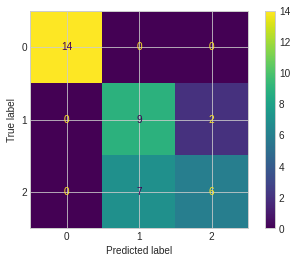

In [ ]:
#Using RBF kernel

svm = SVC(kernel = 'poly',gamma='scale',probability=True)
svm.fit(X_train,y_train)
y_pred_train = svm.predict(X_train)
y_pred_test = svm.predict(X_test)
score_train = sklearn.metrics.accuracy_score(y_train, y_pred_train)
score_test = sklearn.metrics.accuracy_score(y_test, y_pred_test)
print("The Training Accuracy is :",score_train)
print("The Testing Accuracy Score is : ", score_test)
plot_confusion_matrix(svm, X_test, y_test)

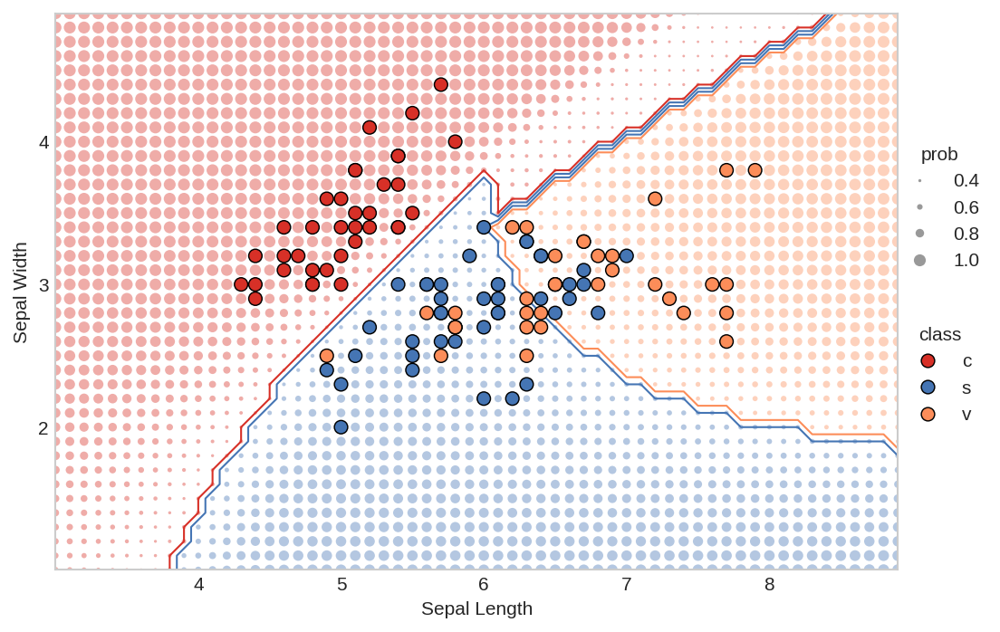

In [ ]:
plot_decision_boundary2D(svm, X_train, y_train, classes, colormap, 
                        step=H, 
                        prob_dot_scale=PROB_DOT_SCALE, 
                        prob_dot_scale_power=PROB_DOT_SCALE_POWER,
                        true_dot_size=TRUE_DOT_SIZE, 
                        pad=PAD,)

# **SVM with PCA**

In [ ]:
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X, Y, test_size = .25)

The Training Accuracy is : 0.8303571428571429
The Testing Accuracy Score is :  0.8157894736842105


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


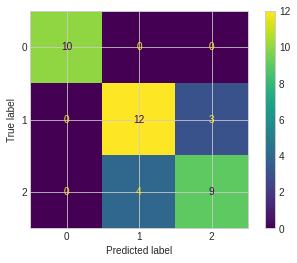

In [ ]:
#Using RBF kernel

svm = SVC(kernel = 'rbf',gamma='scale',probability=True)
svm.fit(X_train_pca,y_train)
y_pred_train = svm.predict(X_train_pca)
y_pred_test = svm.predict(X_test_pca)
score_train = sklearn.metrics.accuracy_score(y_train, y_pred_train)
score_test = sklearn.metrics.accuracy_score(y_test, y_pred_test)
print("The Training Accuracy is :",score_train)
print("The Testing Accuracy Score is : ", score_test)
plot_confusion_matrix(svm, X_test_pca, y_test)

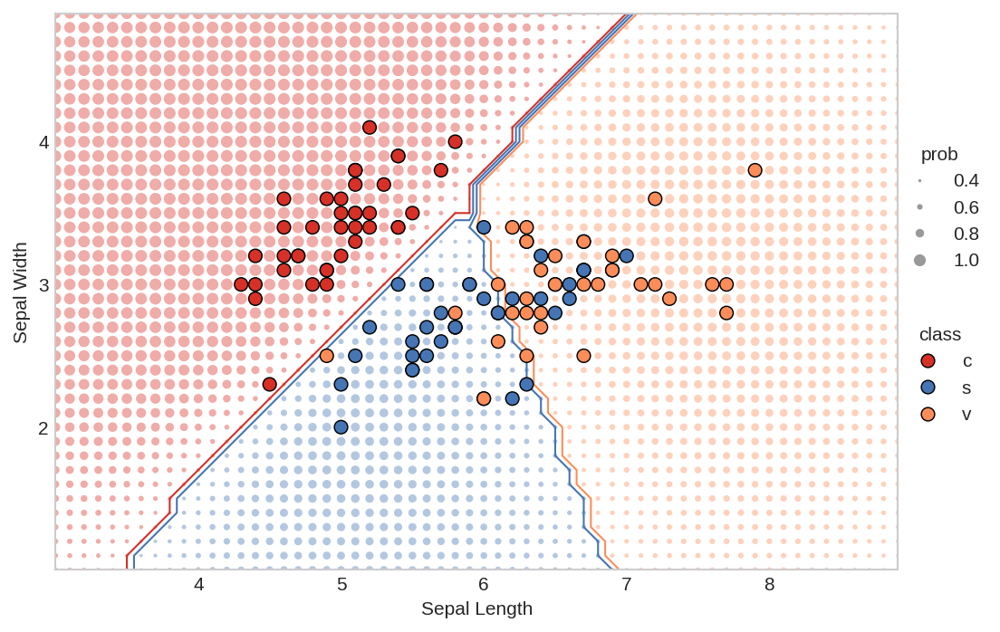

In [ ]:
plot_decision_boundary2D(svm, X_train_pca, y_train, classes, colormap, 
                        step=H, 
                        prob_dot_scale=PROB_DOT_SCALE, 
                        prob_dot_scale_power=PROB_DOT_SCALE_POWER,
                        true_dot_size=TRUE_DOT_SIZE, 
                        pad=PAD,)

The Training Accuracy is : 0.8303571428571429
The Testing Accuracy Score is :  0.7894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


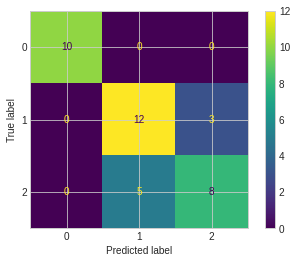

In [ ]:
#Using Polynomial kernel

svm = SVC(kernel = 'poly',gamma='scale',probability=True)
svm.fit(X_train_pca,y_train)
y_pred_train = svm.predict(X_train_pca)
y_pred_test = svm.predict(X_test_pca)
score_train = sklearn.metrics.accuracy_score(y_train, y_pred_train)
score_test = sklearn.metrics.accuracy_score(y_test, y_pred_test)
print("The Training Accuracy is :",score_train)
print("The Testing Accuracy Score is : ", score_test)
plot_confusion_matrix(svm, X_test_pca, y_test)

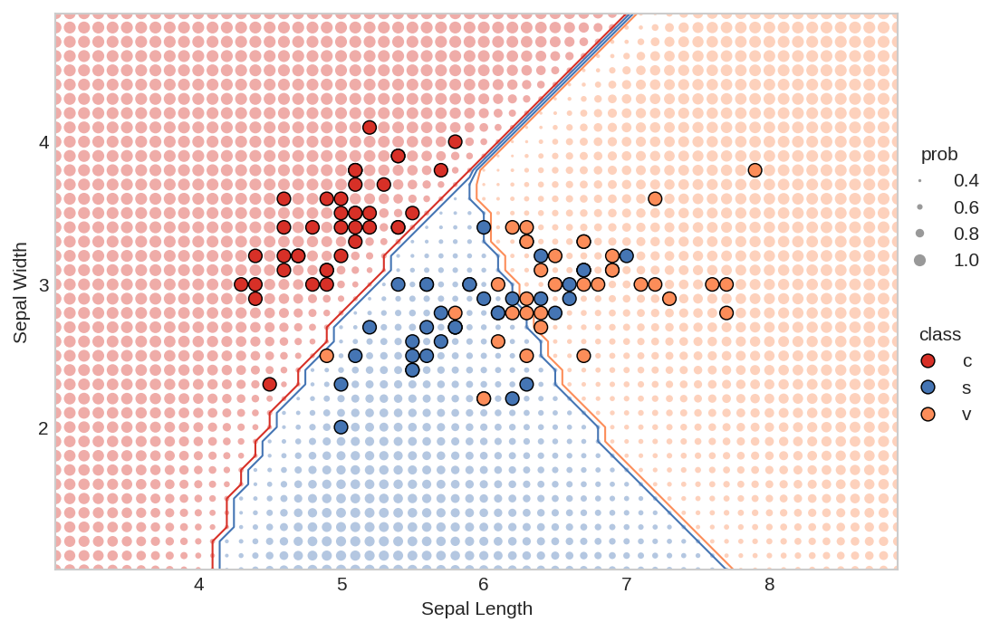

In [ ]:
plot_decision_boundary2D(svm, X_train_pca, y_train, classes, colormap, 
                        step=H, 
                        prob_dot_scale=PROB_DOT_SCALE, 
                        prob_dot_scale_power=PROB_DOT_SCALE_POWER,
                        true_dot_size=TRUE_DOT_SIZE, 
                        pad=PAD,)

# **Logistic Regression**

In [ ]:
from sklearn.linear_model import LogisticRegression
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = .25)

The Training Accuracy is : 0.8214285714285714
The Testing Accuracy Score is :  0.8157894736842105


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


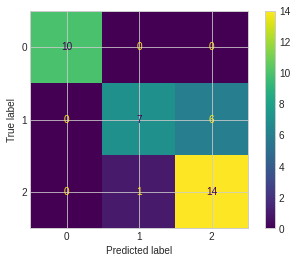

In [ ]:
logistic_regresssor = LogisticRegression(random_state=0, solver="lbfgs")
logistic_regresssor.fit(X_train, y_train)
y_pred_train = logistic_regresssor.predict(X_train)
y_pred_test = logistic_regresssor.predict(X_test)

score_train = sklearn.metrics.accuracy_score(y_train, y_pred_train)
score_test = sklearn.metrics.accuracy_score(y_test, y_pred_test)

print("The Training Accuracy is :",score_train)
print("The Testing Accuracy Score is : ", score_test)
plot_confusion_matrix(logistic_regresssor, X_test, y_test)

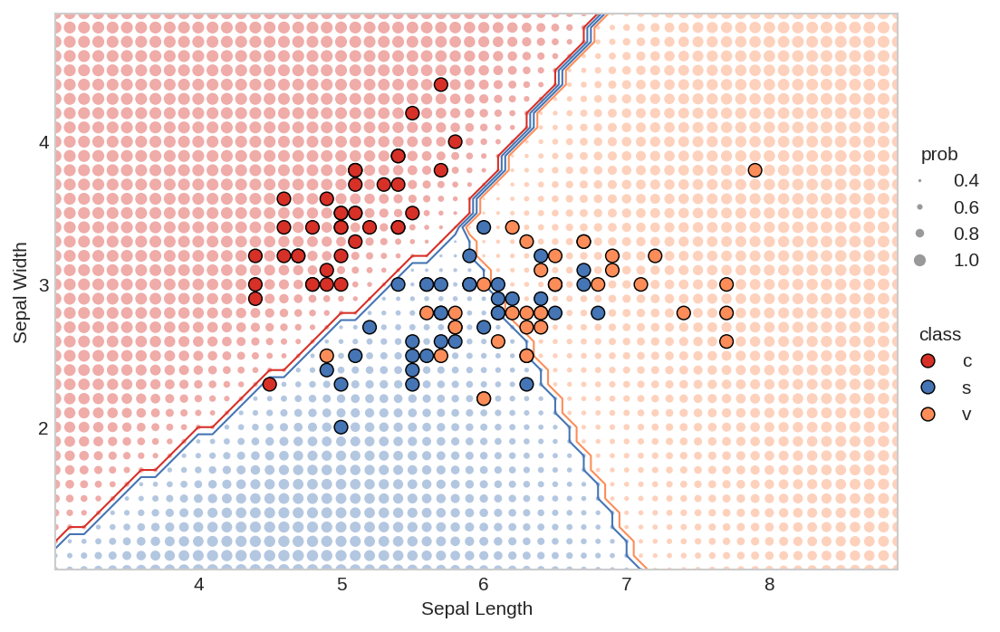

In [ ]:
plot_decision_boundary2D(logistic_regresssor, X_train, y_train, classes, colormap, 
                        step=H, 
                        prob_dot_scale=PROB_DOT_SCALE, 
                        prob_dot_scale_power=PROB_DOT_SCALE_POWER,
                        true_dot_size=TRUE_DOT_SIZE, 
                        pad=PAD,)

# **Logistic Regression with PCA**


In [ ]:
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X, Y, test_size = .25)

The Training Accuracy is : 0.8303571428571429
The Testing Accuracy Score is :  0.7631578947368421


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


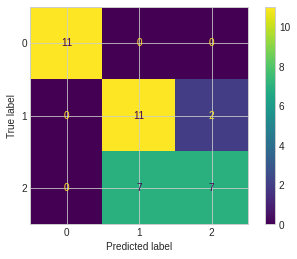

In [ ]:
logistic_regresssor = LogisticRegression(random_state=0, solver="lbfgs")
logistic_regresssor.fit(X_train_pca, y_train)
y_pred_train = logistic_regresssor.predict(X_train_pca)
y_pred_test = logistic_regresssor.predict(X_test_pca)

score_train = sklearn.metrics.accuracy_score(y_train, y_pred_train)
score_test = sklearn.metrics.accuracy_score(y_test, y_pred_test)

print("The Training Accuracy is :",score_train)
print("The Testing Accuracy Score is : ", score_test)
plot_confusion_matrix(logistic_regresssor, X_test_pca, y_test)

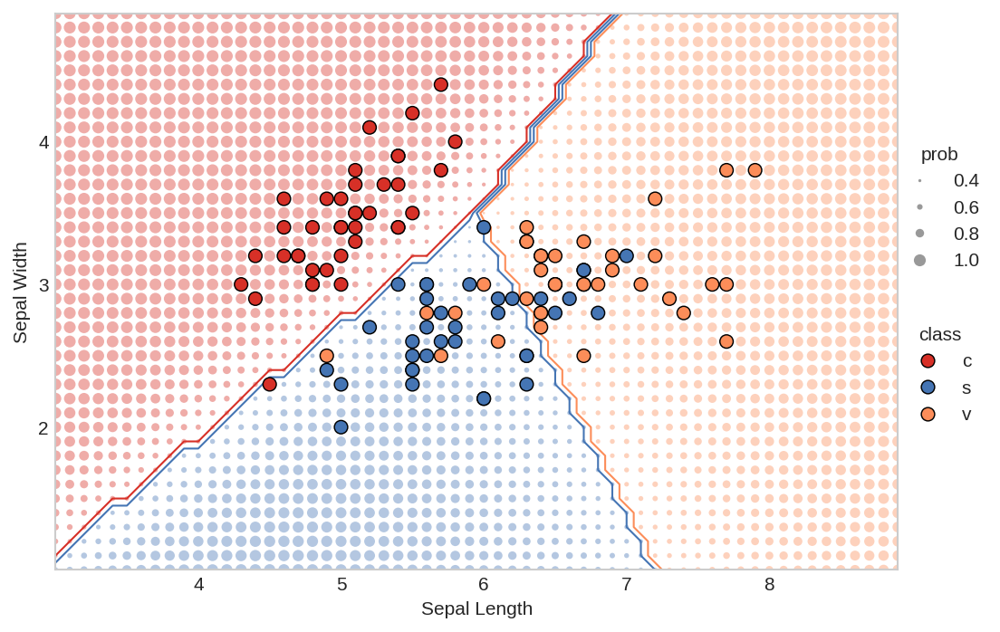

In [ ]:
plot_decision_boundary2D(logistic_regresssor, X_train_pca, y_train, classes, colormap, 
                        step=H, 
                        prob_dot_scale=PROB_DOT_SCALE, 
                        prob_dot_scale_power=PROB_DOT_SCALE_POWER,
                        true_dot_size=TRUE_DOT_SIZE, 
                        pad=PAD,)

# **Decision Tree and Random Forests**

# **Decision Tree**

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = .25)

The Training Accuracy is : 0.9732142857142857
The Testing Accuracy Score is :  0.631578947368421


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


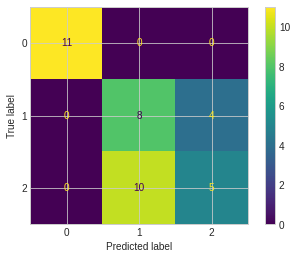

In [ ]:

decision_tree = DecisionTreeClassifier(random_state=0)
decision_tree.fit(X_train,y_train)
y_pred_train = decision_tree.predict(X_train)
y_pred_test = decision_tree.predict(X_test)

score_train = sklearn.metrics.accuracy_score(y_train, y_pred_train)
score_test = sklearn.metrics.accuracy_score(y_test, y_pred_test)

print("The Training Accuracy is :",score_train)
print("The Testing Accuracy Score is : ", score_test)
plot_confusion_matrix(decision_tree, X_test, y_test)

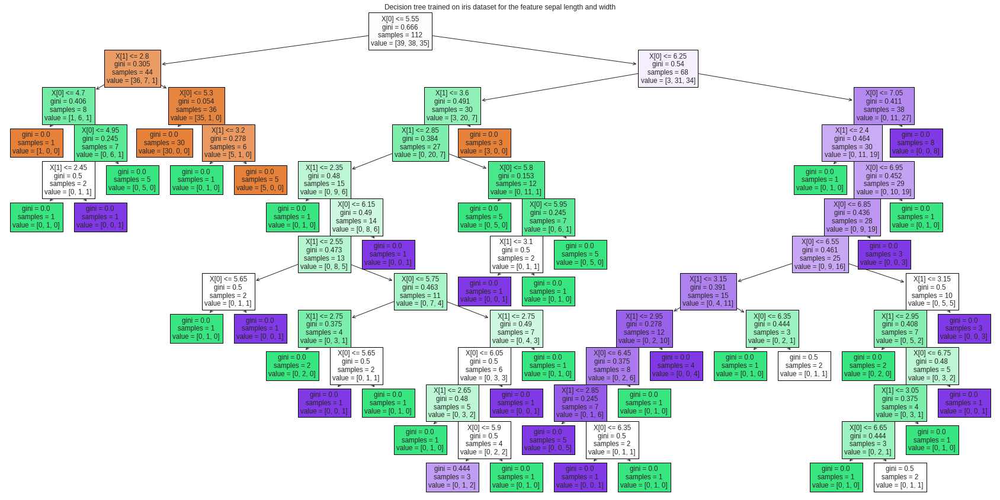

In [ ]:
plt.figure(figsize=(30,15))
plot_tree(decision_tree, filled=True)
plt.title("Decision tree trained on iris dataset for the feature sepal length and width")
plt.show()

**Decision Boundary**

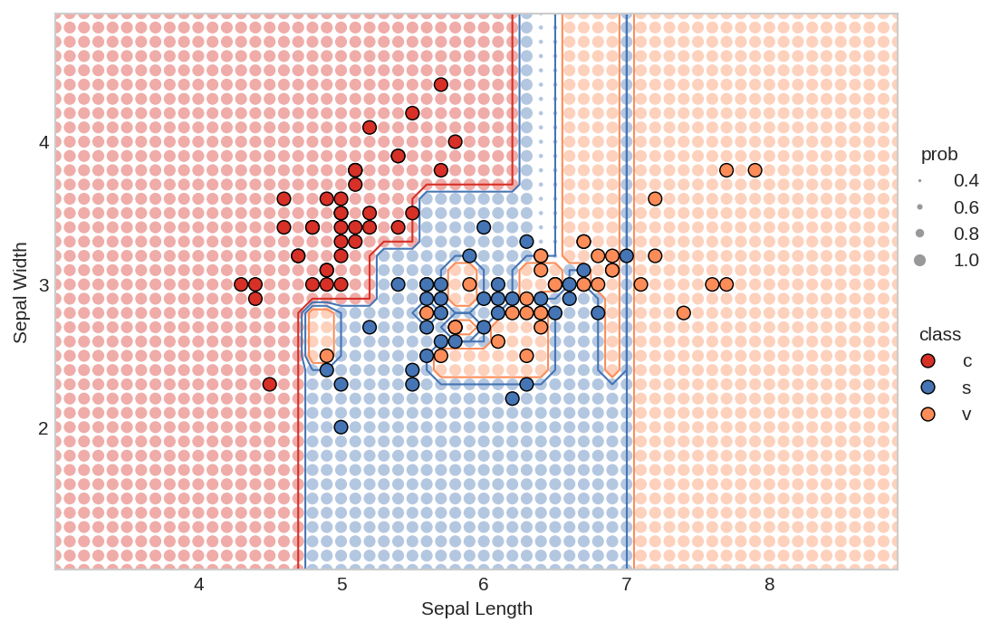

In [ ]:
plot_decision_boundary2D(decision_tree, X_train, y_train, classes, colormap, 
                        step=H, 
                        prob_dot_scale=PROB_DOT_SCALE, 
                        prob_dot_scale_power=PROB_DOT_SCALE_POWER,
                        true_dot_size=TRUE_DOT_SIZE, 
                        pad=PAD,)

# **Decision Tree with PCA**

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X, Y, test_size = .25)

The Training Accuracy is : 0.9285714285714286
The Testing Accuracy Score is :  0.7894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


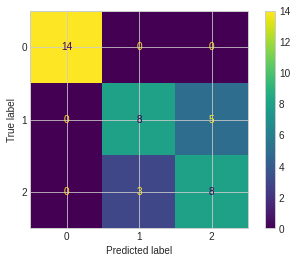

In [ ]:

decision_tree = DecisionTreeClassifier(random_state=0)
decision_tree.fit(X_train_pca,y_train)
y_pred_train = decision_tree.predict(X_train_pca)
y_pred_test = decision_tree.predict(X_test_pca)

score_train = sklearn.metrics.accuracy_score(y_train, y_pred_train)
score_test = sklearn.metrics.accuracy_score(y_test, y_pred_test)

print("The Training Accuracy is :",score_train)
print("The Testing Accuracy Score is : ", score_test)
plot_confusion_matrix(decision_tree, X_test_pca, y_test)

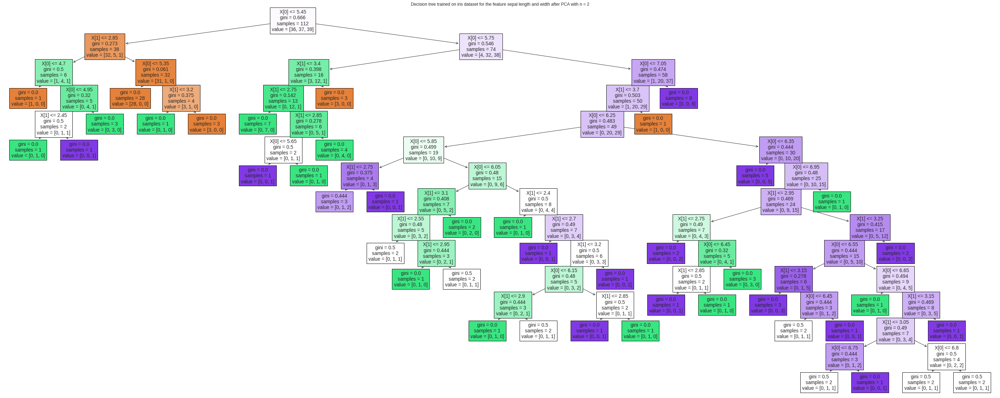

In [ ]:
plt.figure(figsize=(50,20))
plot_tree(decision_tree, filled=True)
plt.title("Decision tree trained on iris dataset for the feature sepal length and width after PCA with n = 2")
plt.show()

**Decision Boundary**

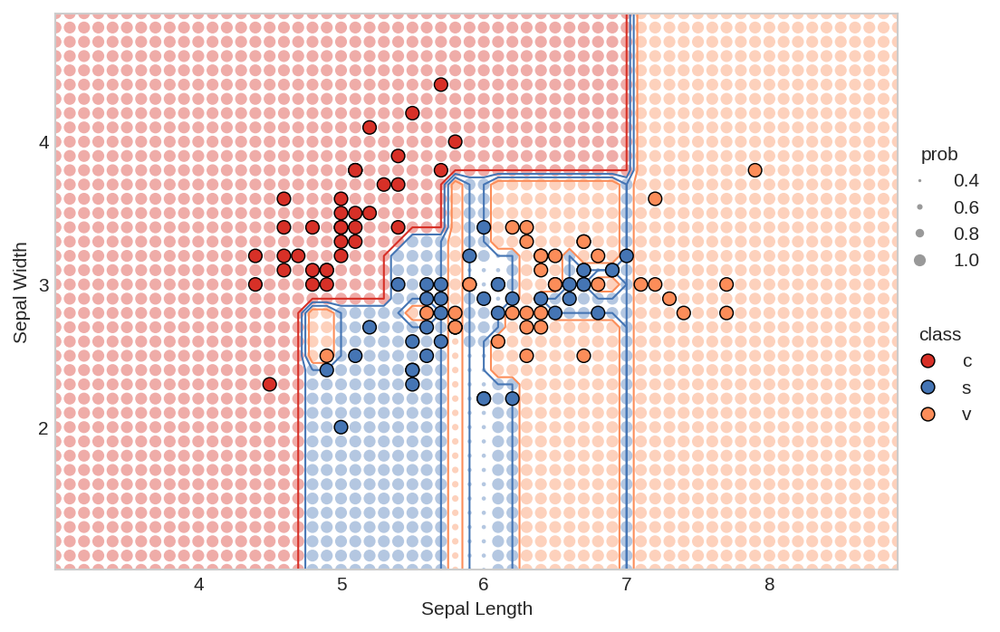

In [ ]:
plot_decision_boundary2D(decision_tree, X_train_pca, y_train, classes, colormap, 
                        step=H, 
                        prob_dot_scale=PROB_DOT_SCALE, 
                        prob_dot_scale_power=PROB_DOT_SCALE_POWER,
                        true_dot_size=TRUE_DOT_SIZE, 
                        pad=PAD,)

# **Random Forest**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = .25)

The Training Accuracy is : 0.9375
The Testing Accuracy Score is :  0.7894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


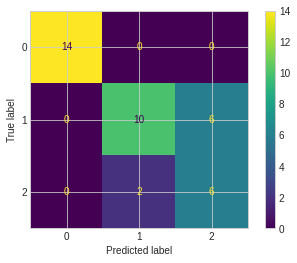

In [ ]:

random_forest = RandomForestClassifier(random_state=0, n_estimators = 100, criterion = 'entropy',max_depth=12, max_features="log2")
random_forest.fit(X_train,y_train)
y_pred_train = random_forest.predict(X_train)
y_pred_test = random_forest.predict(X_test)

score_train = sklearn.metrics.accuracy_score(y_train, y_pred_train)
score_test = sklearn.metrics.accuracy_score(y_test, y_pred_test)

print("The Training Accuracy is :",score_train)
print("The Testing Accuracy Score is : ", score_test)
plot_confusion_matrix(random_forest, X_test, y_test)

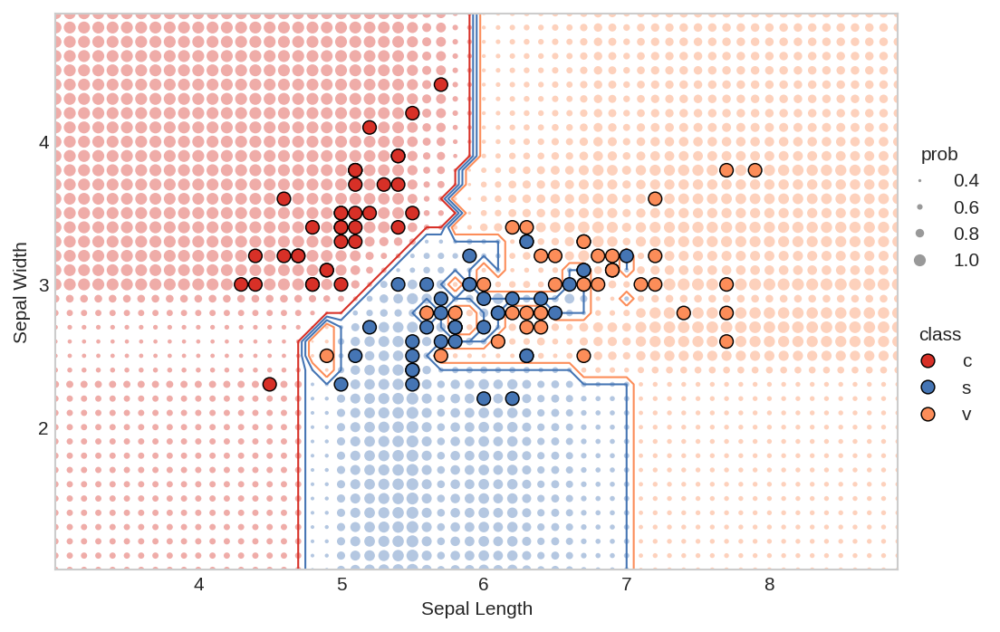

In [ ]:
plot_decision_boundary2D(random_forest, X_train, y_train, classes, colormap, 
                        step=H, 
                        prob_dot_scale=PROB_DOT_SCALE, 
                        prob_dot_scale_power=PROB_DOT_SCALE_POWER,
                        true_dot_size=TRUE_DOT_SIZE, 
                        pad=PAD,)

**Random Forest with PCA**

In [ ]:
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X, Y, test_size = .25)

The Training Accuracy is : 0.9732142857142857
The Testing Accuracy Score is :  0.5789473684210527


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


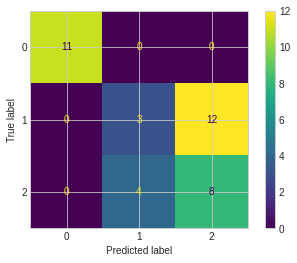

In [ ]:

random_forest = RandomForestClassifier(random_state=0,criterion = 'entropy',max_depth=12, max_features="sqrt")
random_forest.fit(X_train_pca,y_train)
y_pred_train = random_forest.predict(X_train_pca)
y_pred_test = random_forest.predict(X_test_pca)

score_train = sklearn.metrics.accuracy_score(y_train, y_pred_train)
score_test = sklearn.metrics.accuracy_score(y_test, y_pred_test)

print("The Training Accuracy is :",score_train)
print("The Testing Accuracy Score is : ", score_test)
plot_confusion_matrix(random_forest, X_test_pca, y_test)

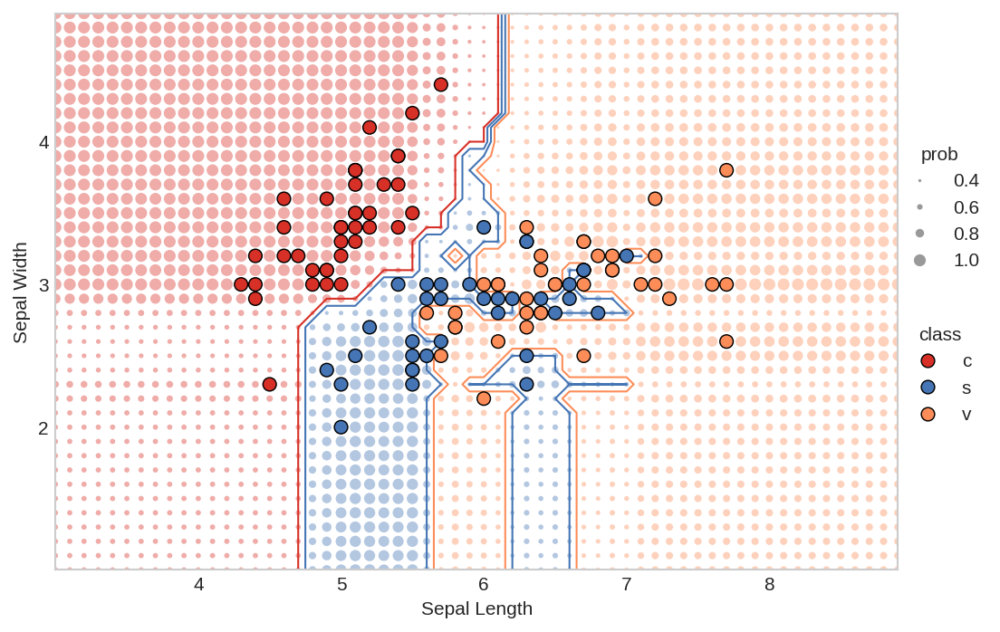

In [ ]:
plot_decision_boundary2D(random_forest, X_train_pca, y_train, classes, colormap, 
                        step=H, 
                        prob_dot_scale=PROB_DOT_SCALE, 
                        prob_dot_scale_power=PROB_DOT_SCALE_POWER,
                        true_dot_size=TRUE_DOT_SIZE, 
                        pad=PAD,)

# **Gaussian Naive Bayes**

In [ ]:
from sklearn.naive_bayes import GaussianNB
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = .25)

The Training Accuracy is : 0.7767857142857143
The Testing Accuracy Score is :  0.7631578947368421


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


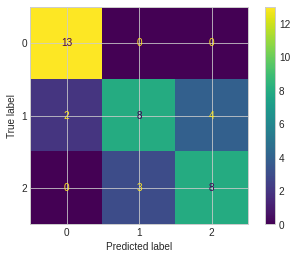

In [ ]:

bayes = GaussianNB()
bayes.fit(X_train,y_train)
y_pred_train = bayes.predict(X_train)
y_pred_test = bayes.predict(X_test)

score_train = sklearn.metrics.accuracy_score(y_train, y_pred_train)
score_test = sklearn.metrics.accuracy_score(y_test, y_pred_test)

print("The Training Accuracy is :",score_train)
print("The Testing Accuracy Score is : ", score_test)
plot_confusion_matrix(bayes, X_test, y_test)

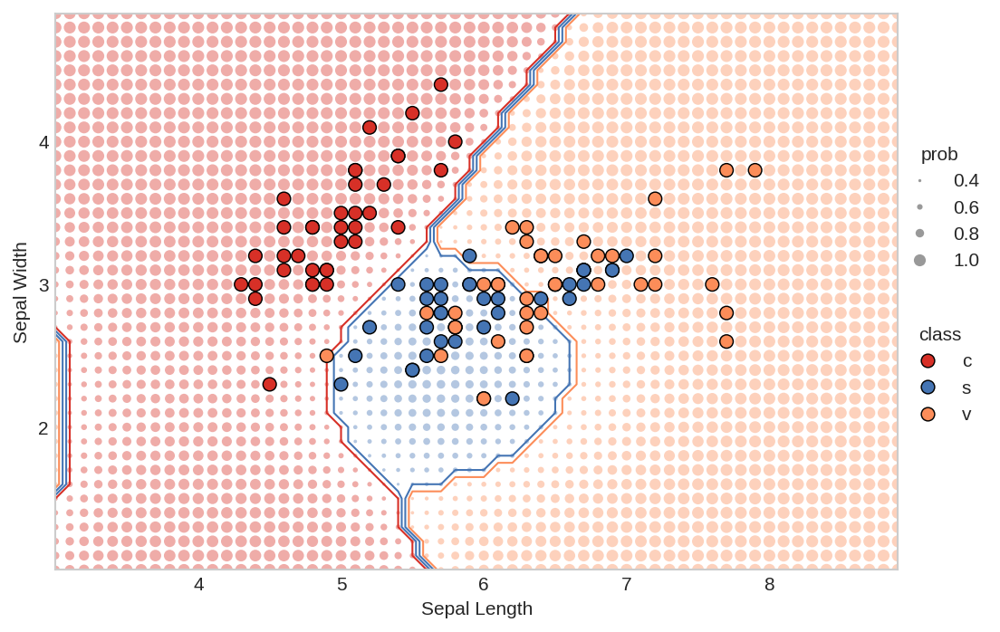

In [ ]:
plot_decision_boundary2D(bayes, X_train, y_train, classes, colormap, 
                        step=H, 
                        prob_dot_scale=PROB_DOT_SCALE, 
                        prob_dot_scale_power=PROB_DOT_SCALE_POWER,
                        true_dot_size=TRUE_DOT_SIZE, 
                        pad=PAD,)

# **Naive Bayes with PCA**

In [ ]:
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X, Y, test_size = .25)

The Training Accuracy is : 0.8214285714285714
The Testing Accuracy Score is :  0.7105263157894737


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


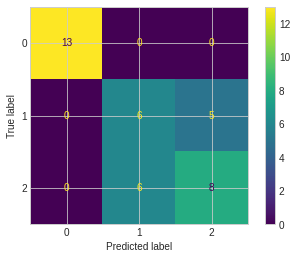

In [ ]:
bayes = GaussianNB()
bayes.fit(X_train_pca,y_train)
y_pred_train = bayes.predict(X_train_pca)
y_pred_test = bayes.predict(X_test_pca)

score_train = sklearn.metrics.accuracy_score(y_train, y_pred_train)
score_test = sklearn.metrics.accuracy_score(y_test, y_pred_test)

print("The Training Accuracy is :",score_train)
print("The Testing Accuracy Score is : ", score_test)
plot_confusion_matrix(bayes, X_test_pca, y_test)

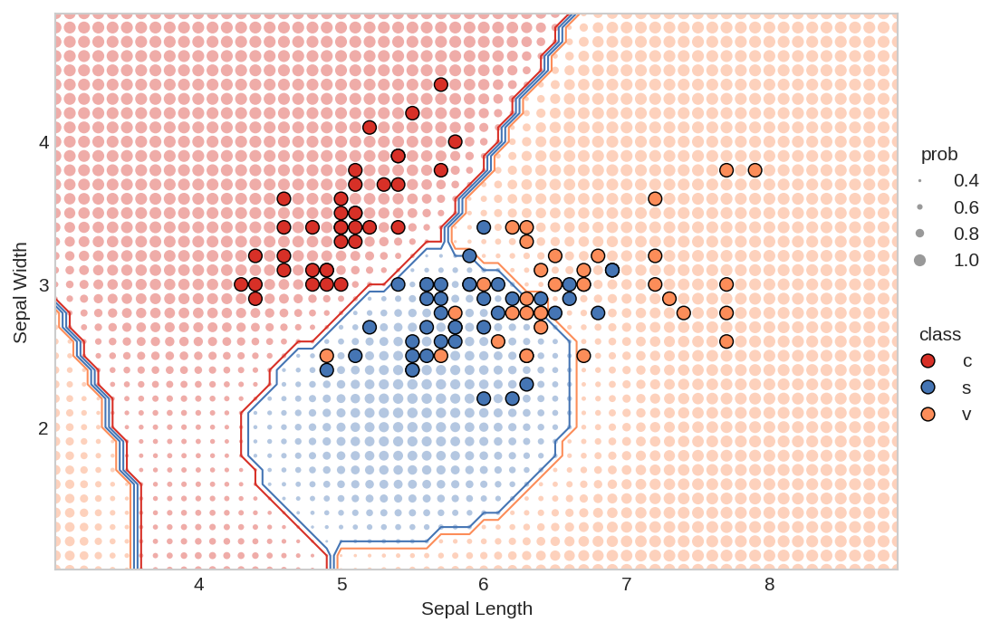

In [ ]:
plot_decision_boundary2D(bayes, X_train_pca, y_train, classes, colormap, 
                        step=H, 
                        prob_dot_scale=PROB_DOT_SCALE, 
                        prob_dot_scale_power=PROB_DOT_SCALE_POWER,
                        true_dot_size=TRUE_DOT_SIZE, 
                        pad=PAD,)